In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


import plotly
import plotly.express as px

import plotly.graph_objects as go
import plotly.offline as pyo
from plotly.offline import init_notebook_mode

from sklearn.preprocessing import StandardScaler

from sklearn.cluster import KMeans

import warnings
warnings.filterwarnings('ignore')

**Combining required CSV Files together.**

In [2]:
df1=pd.read_csv('01_District_wise_crimes_committed_IPC_2001_2012.csv')
df2=pd.read_csv('42_District_wise_crimes_committed_against_women_2001_2012.csv')
df3=pd.read_csv('03_District_wise_crimes_committed_against_children_2001_2012.csv') 
df4=pd.read_csv('02_01_District_wise_crimes_committed_against_SC_2001_2012.csv')
df5=pd.read_csv('02_District_wise_crimes_committed_against_ST_2001_2012.csv')

So Here we have created data frames of all respective csv files,
Now we are creating a combined dataframe with required columns from the diffrent dataframes. 

**Here I have created "Total crimes against women","Total crimes against children","Total crimes against SCs","Total crimes against STs" those column's in the respective csv files** 

In [3]:
df=pd.concat([df1,df2['Total crimes against women'],df3['Total crimes against children'],df4['Total crimes against SCs'],df5['Total crimes against STs']],axis=1)

In [4]:
df

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,Total crimes against women,Total crimes against children,Total crimes against SCs,Total crimes against STs
0,ANDHRA PRADESH,ADILABAD,2001.0,101.0,60.0,17.0,50.0,0.0,50.0,46.0,...,34.0,175.0,0.0,181.0,1518.0,4154.0,454.0,0.0,55,18
1,ANDHRA PRADESH,ANANTAPUR,2001.0,151.0,125.0,1.0,23.0,0.0,23.0,53.0,...,24.0,154.0,0.0,270.0,754.0,4125.0,356.0,132.0,127,14
2,ANDHRA PRADESH,CHITTOOR,2001.0,101.0,57.0,2.0,27.0,0.0,27.0,59.0,...,83.0,186.0,0.0,404.0,1262.0,5818.0,456.0,0.0,114,2
3,ANDHRA PRADESH,CUDDAPAH,2001.0,80.0,53.0,1.0,20.0,0.0,20.0,25.0,...,38.0,57.0,0.0,233.0,1181.0,3140.0,278.0,0.0,100,4
4,ANDHRA PRADESH,EAST GODAVARI,2001.0,82.0,67.0,1.0,23.0,0.0,23.0,49.0,...,58.0,247.0,0.0,431.0,2313.0,6507.0,475.0,0.0,89,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9013,LAKSHADWEEP,TOTAL,2012.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,32.0,60.0,2.0,50.0,0,0
9014,PUDUCHERRY,KARAIKAL,2012.0,5.0,6.0,2.0,6.0,0.0,6.0,2.0,...,0.0,1.0,0.0,44.0,392.0,787.0,11.0,64.0,0,0
9015,PUDUCHERRY,PUDUCHERRY,2012.0,24.0,21.0,10.0,7.0,0.0,7.0,17.0,...,2.0,5.0,0.0,219.0,1668.0,3494.0,35.0,NaN,1,0
9016,PUDUCHERRY,TOTAL,2012.0,29.0,27.0,12.0,13.0,0.0,13.0,19.0,...,2.0,6.0,0.0,263.0,2060.0,4281.0,46.0,NaN,23,0


In [5]:
print("We have {} Rows and {} Columns in our dataframe".format(df.shape[0], df.shape[1]))
df.head(2)

We have 9018 Rows and 37 Columns in our dataframe


,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,Total crimes against women,Total crimes against children,Total crimes against SCs,Total crimes against STs
0,ANDHRA PRADESH,ADILABAD,2001.0,101.0,60.0,17.0,50.0,0.0,50.0,46.0,...,34.0,175.0,0.0,181.0,1518.0,4154.0,454.0,0.0,55,18
1,ANDHRA PRADESH,ANANTAPUR,2001.0,151.0,125.0,1.0,23.0,0.0,23.0,53.0,...,24.0,154.0,0.0,270.0,754.0,4125.0,356.0,132.0,127,14


In [6]:
# Using the info methode to check columns for information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9018 entries, 0 to 9017
Data columns (total 37 columns):
 #   Column                                               Non-Null Count  Dtype  
---  ------                                               --------------  -----  
 0   STATE/UT                                             9017 non-null   object 
 1   DISTRICT                                             9017 non-null   object 
 2   YEAR                                                 9017 non-null   float64
 3   MURDER                                               9017 non-null   float64
 4   ATTEMPT TO MURDER                                    9017 non-null   float64
 5   CULPABLE HOMICIDE NOT AMOUNTING TO MURDER            9017 non-null   float64
 6   RAPE                                                 9017 non-null   float64
 7   CUSTODIAL RAPE                                       9017 non-null   float64
 8   OTHER RAPE                                           9017 non-null  

**Column Description:**

State/UT: Each state or union territory is represented individually.

District: Distinct districts are listed for each state.

Year: The data spans from 2001 to 2012, covering the timeframe of recorded crimes.

Various Crimes: The dataset includes a range of offenses such as homicide, murder, attempted murder, kidnapping, rape, dacoity, robbery, burglary, theft, riots, breach of trust, dowry deaths, cheating, counterfeiting, arson, assault, cruelty against women, insult to modesty, domestic violence, human trafficking, negligence causing death, and other offenses listed under the Indian Penal Code (IPC).

Special Categories: Additionally, the data categorizes offenses against specific groups, including females, children, Scheduled Castes (SCs), and Scheduled Tribes (STs).

In [7]:
## examining any absent values
df.isna().sum()

STATE/UT                                               1
DISTRICT                                               1
YEAR                                                   1
MURDER                                                 1
ATTEMPT TO MURDER                                      1
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER              1
RAPE                                                   1
CUSTODIAL RAPE                                         1
OTHER RAPE                                             1
KIDNAPPING & ABDUCTION                                 1
KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS            1
KIDNAPPING AND ABDUCTION OF OTHERS                     1
DACOITY                                                1
PREPARATION AND ASSEMBLY FOR DACOITY                   1
ROBBERY                                                1
BURGLARY                                               1
THEFT                                                  1
AUTO THEFT                     

Given the limited number of missing values in our dataset, we can confidently remove these null entries without any significant impact on the overall dataset.

In [8]:
df = df.dropna()

In [9]:
df

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,Total crimes against women,Total crimes against children,Total crimes against SCs,Total crimes against STs
0,ANDHRA PRADESH,ADILABAD,2001.0,101.0,60.0,17.0,50.0,0.0,50.0,46.0,...,34.0,175.0,0.0,181.0,1518.0,4154.0,454.0,0.0,55,18
1,ANDHRA PRADESH,ANANTAPUR,2001.0,151.0,125.0,1.0,23.0,0.0,23.0,53.0,...,24.0,154.0,0.0,270.0,754.0,4125.0,356.0,132.0,127,14
2,ANDHRA PRADESH,CHITTOOR,2001.0,101.0,57.0,2.0,27.0,0.0,27.0,59.0,...,83.0,186.0,0.0,404.0,1262.0,5818.0,456.0,0.0,114,2
3,ANDHRA PRADESH,CUDDAPAH,2001.0,80.0,53.0,1.0,20.0,0.0,20.0,25.0,...,38.0,57.0,0.0,233.0,1181.0,3140.0,278.0,0.0,100,4
4,ANDHRA PRADESH,EAST GODAVARI,2001.0,82.0,67.0,1.0,23.0,0.0,23.0,49.0,...,58.0,247.0,0.0,431.0,2313.0,6507.0,475.0,0.0,89,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9010,DELHI UT,STF,2012.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,6.0,0.0,0.0,0,0
9011,DELHI UT,WEST,2012.0,52.0,37.0,10.0,79.0,0.0,79.0,454.0,...,6.0,327.0,0.0,292.0,1144.0,5558.0,739.0,0.0,2,0
9012,LAKSHADWEEP,LAKSHADWEEP,2012.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,32.0,60.0,2.0,14.0,44,0
9013,LAKSHADWEEP,TOTAL,2012.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,32.0,60.0,2.0,50.0,0,0


With a dataset comprising 9000 rows, the removal of just 3 rows, each with 3 missing values, had a negligible impact on our dataset.

In [10]:
df['DISTRICT'].value_counts()

DISTRICT
TOTAL              407
G.R.P.              46
SOUTH               37
NORTH               37
WEST                36
                  ... 
RAILWAYS KMR         1
MIDNAPUR             1
A and N ISLANDS      1
KAWARDHA             1
CAR                  1
Name: count, Length: 808, dtype: int64

Given that the "Total" rows in the District column represent the cumulative numbers for the states, and considering our need for district-level clusters, it is advisable to eliminate these total rows along with the total rows for the DELHI UT.

In [11]:
## This code block helps identify the index values where the "DISTRICT" column contains the value 'TOTAL' in the DataFrame
print(list(np.where(df1["DISTRICT"]=='TOTAL')))

[array([  28,   42,   70,  115,  135,  138,  169,  190,  204,  228,  253,
        285,  302,  351,  397,  407,  415,  424,  435,  470,  495,  529,
        534,  573,  578,  650,  664,  688,  691,  693,  695,  698,  713,
        715,  744,  758,  786,  831,  851,  854,  885,  906,  920,  945,
        970, 1002, 1019, 1068, 1114, 1124, 1132, 1141, 1152, 1187, 1212,
       1246, 1251, 1289, 1294, 1366, 1380, 1406, 1409, 1411, 1413, 1416,
       1432, 1434, 1464, 1480, 1508, 1553, 1574, 1577, 1608, 1629, 1643,
       1668, 1693, 1725, 1745, 1797, 1843, 1853, 1861, 1870, 1881, 1916,
       1941, 1975, 1980, 2018, 2023, 2095, 2109, 2135, 2138, 2140, 2142,
       2145, 2160, 2162, 2192, 2208, 2236, 2281, 2302, 2305, 2336, 2357,
       2371, 2396, 2421, 2453, 2473, 2525, 2571, 2581, 2589, 2598, 2609,
       2644, 2669, 2703, 2708, 2747, 2752, 2824, 2838, 2864, 2867, 2869,
       2871, 2874, 2889, 2891, 2921, 2937, 2968, 3013, 3035, 3038, 3069,
       3091, 3105, 3130, 3155, 3187, 3207, 3259, 3

In [12]:
print(list(np.where(df1["DISTRICT"]=='TOTAL')))

[array([  28,   42,   70,  115,  135,  138,  169,  190,  204,  228,  253,
        285,  302,  351,  397,  407,  415,  424,  435,  470,  495,  529,
        534,  573,  578,  650,  664,  688,  691,  693,  695,  698,  713,
        715,  744,  758,  786,  831,  851,  854,  885,  906,  920,  945,
        970, 1002, 1019, 1068, 1114, 1124, 1132, 1141, 1152, 1187, 1212,
       1246, 1251, 1289, 1294, 1366, 1380, 1406, 1409, 1411, 1413, 1416,
       1432, 1434, 1464, 1480, 1508, 1553, 1574, 1577, 1608, 1629, 1643,
       1668, 1693, 1725, 1745, 1797, 1843, 1853, 1861, 1870, 1881, 1916,
       1941, 1975, 1980, 2018, 2023, 2095, 2109, 2135, 2138, 2140, 2142,
       2145, 2160, 2162, 2192, 2208, 2236, 2281, 2302, 2305, 2336, 2357,
       2371, 2396, 2421, 2453, 2473, 2525, 2571, 2581, 2589, 2598, 2609,
       2644, 2669, 2703, 2708, 2747, 2752, 2824, 2838, 2864, 2867, 2869,
       2871, 2874, 2889, 2891, 2921, 2937, 2968, 3013, 3035, 3038, 3069,
       3091, 3105, 3130, 3155, 3187, 3207, 3259, 3

In [13]:
print(list(np.where(df1["DISTRICT"]=='DELHI UT TOTAL')))

[array([ 700, 1418, 2147, 2876, 3609, 4348, 5090, 5849, 6616, 7395, 8186,
       8997], dtype=int64)]


We can drop these rows as we have the indices values for each Total and DELHI Total row.

In [14]:
# Obtain the index values where the "DISTRICT" column contains 'TOTAL'
total_indices = df[df["DISTRICT"] == 'TOTAL'].index.tolist()

# Obtain the index values where the "STATE/UT" column contains 'DELHI UT'
delhi_ut_indices = df[df["STATE/UT"] == 'DELHI UT'].index.tolist()

# Combine both sets of indices to be dropped
indices_to_drop = total_indices + delhi_ut_indices

# Drop rows with the obtained indices
df.drop(indices_to_drop, axis=0, inplace=True)


In [15]:
df.reset_index(drop = True)

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,Total crimes against women,Total crimes against children,Total crimes against SCs,Total crimes against STs
0,ANDHRA PRADESH,ADILABAD,2001.0,101.0,60.0,17.0,50.0,0.0,50.0,46.0,...,34.0,175.0,0.0,181.0,1518.0,4154.0,454.0,0.0,55,18
1,ANDHRA PRADESH,ANANTAPUR,2001.0,151.0,125.0,1.0,23.0,0.0,23.0,53.0,...,24.0,154.0,0.0,270.0,754.0,4125.0,356.0,132.0,127,14
2,ANDHRA PRADESH,CHITTOOR,2001.0,101.0,57.0,2.0,27.0,0.0,27.0,59.0,...,83.0,186.0,0.0,404.0,1262.0,5818.0,456.0,0.0,114,2
3,ANDHRA PRADESH,CUDDAPAH,2001.0,80.0,53.0,1.0,20.0,0.0,20.0,25.0,...,38.0,57.0,0.0,233.0,1181.0,3140.0,278.0,0.0,100,4
4,ANDHRA PRADESH,EAST GODAVARI,2001.0,82.0,67.0,1.0,23.0,0.0,23.0,49.0,...,58.0,247.0,0.0,431.0,2313.0,6507.0,475.0,0.0,89,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,D & N HAVELI,D and N HAVELI,2012.0,7.0,2.0,0.0,3.0,0.0,3.0,13.0,...,0.0,0.0,0.0,23.0,112.0,318.0,14.0,14.0,2,0
8421,DAMAN & DIU,DAMAN,2012.0,3.0,4.0,0.0,5.0,0.0,5.0,2.0,...,0.0,1.0,0.0,29.0,34.0,202.0,6.0,16.0,0,4
8422,DAMAN & DIU,DIU,2012.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,2.0,0.0,9.0,12.0,37.0,2.0,0.0,0,0
8423,LAKSHADWEEP,LAKSHADWEEP,2012.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,32.0,60.0,2.0,14.0,44,0


In [16]:
print("We have {} Rows and {} Columns in our dataframe".format(df.shape[0], df.shape[1]))

We have 8425 Rows and 37 Columns in our dataframe


**We've eliminated several columns from our dataset as they duplicate information already present under the category of total crimes against women. These excluded columns are: "INSULT TO MODESTY OF WOMEN," "KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS," "CRUELTY BY HUSBAND OR HIS RELATIVES," "IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES," and "ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY."**

In [17]:
df.drop(['INSULT TO MODESTY OF WOMEN','KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS','CRUELTY BY HUSBAND OR HIS RELATIVES',
       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
    'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY'],axis=1, inplace=True)

In [18]:
df

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,Total crimes against women,Total crimes against children,Total crimes against SCs,Total crimes against STs
0,ANDHRA PRADESH,ADILABAD,2001.0,101.0,60.0,17.0,50.0,0.0,50.0,46.0,...,30.0,1131.0,16.0,181.0,1518.0,4154.0,454.0,0.0,55,18
1,ANDHRA PRADESH,ANANTAPUR,2001.0,151.0,125.0,1.0,23.0,0.0,23.0,53.0,...,69.0,1543.0,7.0,270.0,754.0,4125.0,356.0,132.0,127,14
2,ANDHRA PRADESH,CHITTOOR,2001.0,101.0,57.0,2.0,27.0,0.0,27.0,59.0,...,38.0,2088.0,14.0,404.0,1262.0,5818.0,456.0,0.0,114,2
3,ANDHRA PRADESH,CUDDAPAH,2001.0,80.0,53.0,1.0,20.0,0.0,20.0,25.0,...,23.0,795.0,17.0,233.0,1181.0,3140.0,278.0,0.0,100,4
4,ANDHRA PRADESH,EAST GODAVARI,2001.0,82.0,67.0,1.0,23.0,0.0,23.0,49.0,...,41.0,1244.0,12.0,431.0,2313.0,6507.0,475.0,0.0,89,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8989,D & N HAVELI,D and N HAVELI,2012.0,7.0,2.0,0.0,3.0,0.0,3.0,13.0,...,12.0,25.0,0.0,23.0,112.0,318.0,14.0,14.0,2,0
8991,DAMAN & DIU,DAMAN,2012.0,3.0,4.0,0.0,5.0,0.0,5.0,2.0,...,10.0,15.0,0.0,29.0,34.0,202.0,6.0,16.0,0,4
8992,DAMAN & DIU,DIU,2012.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,1.0,2.0,0.0,9.0,12.0,37.0,2.0,0.0,0,0
9012,LAKSHADWEEP,LAKSHADWEEP,2012.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.0,3.0,0.0,0.0,32.0,60.0,2.0,14.0,44,0


In [19]:
print("We have {} Rows and {} Columns in our dataframe".format(df.shape[0], df.shape[1]))

We have 8425 Rows and 32 Columns in our dataframe


In [20]:
df.describe()

,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF OTHERS,DACOITY,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,Total crimes against women,Total crimes against children,Total crimes against SCs,Total crimes against STs
count,8425.000000,8425.000000,8425.000000,8425.000000,8425.00000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,...,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000
mean,2006.627537,47.040237,41.148843,5.189436,27.62089,0.003086,27.617804,39.377685,9.912641,7.005697,...,13.426706,397.511454,10.637389,117.999050,1135.157745,2766.051751,237.320356,102.520593,71.186350,13.016024
std,3.463403,42.913304,50.913170,10.024517,30.71858,0.080005,30.714481,49.869850,18.188053,11.028721,...,30.686497,563.786116,14.268643,156.517181,1440.785381,3068.951935,292.155407,495.867410,326.950027,64.041192
min,2001.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,2004.000000,18.000000,10.000000,0.000000,8.00000,0.000000,8.000000,9.000000,1.000000,1.000000,...,2.000000,41.000000,1.000000,5.000000,257.000000,834.000000,62.000000,0.000000,1.000000,0.000000
50%,2007.000000,37.000000,27.000000,2.000000,19.00000,0.000000,19.000000,24.000000,5.000000,3.000000,...,8.000000,194.000000,5.000000,67.000000,709.000000,1992.000000,160.000000,20.000000,19.000000,0.000000
75%,2010.000000,63.000000,54.000000,5.000000,38.00000,0.000000,38.000000,51.000000,11.000000,9.000000,...,18.000000,501.000000,15.000000,168.000000,1513.000000,3746.000000,305.000000,74.000000,62.000000,9.000000
max,2012.000000,542.000000,741.000000,241.000000,568.00000,5.000000,568.000000,587.000000,484.000000,219.000000,...,2350.000000,4837.000000,168.000000,2058.000000,32452.000000,34638.000000,4556.000000,12066.000000,8009.000000,1501.000000


**Observations:**

In the murder column, we observe a range from 0 to 542, suggesting that certain districts have reported the maximum number of murders.
For the "ATTEMPT TO MURDER" category, the maximum count is 741, while for "RAPE," it stands at 568. Other columns should be examined similarly.
Total crimes against women vary between 0 and 4556, whereas total IPC offenses range from 0 to 34638.
Based on these insights, districts with moderate values are classified as moderate areas, those with maximum values are categorized as sensitive areas, and those with minimum values are labeled peaceful areas.

**Examining the dataset by district grouping**

In [21]:
#Sorting by state or territory
group_state = df.groupby('STATE/UT')

In [22]:
group_state.first()

,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF OTHERS,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,Total crimes against women,Total crimes against children,Total crimes against SCs,Total crimes against STs
STATE/UT,,,,,,,,,,,,,,,,,,,,,
A & N ISLANDS,ANDAMAN,2001.0,13.0,0.0,0.0,3.0,0.0,3.0,2.0,0.0,...,4.0,113.0,0.0,0.0,310.0,637.0,33.0,0.0,0,0
ANDHRA PRADESH,ADILABAD,2001.0,101.0,60.0,17.0,50.0,0.0,50.0,46.0,16.0,...,30.0,1131.0,16.0,181.0,1518.0,4154.0,454.0,0.0,55,18
ARUNACHAL PRADESH,CHANGLANG,2001.0,11.0,2.0,0.0,1.0,0.0,1.0,3.0,1.0,...,1.0,30.0,0.0,0.0,54.0,163.0,6.0,0.0,0,5
ASSAM,BARPETA,2001.0,64.0,5.0,0.0,28.0,0.0,28.0,105.0,17.0,...,38.0,266.0,10.0,87.0,430.0,1778.0,250.0,0.0,0,0
BIHAR,ARARIA,2001.0,47.0,27.0,4.0,93.0,0.0,93.0,79.0,66.0,...,3.0,10.0,11.0,26.0,944.0,2069.0,170.0,24.0,43,4
CHANDIGARH,CHANDIGARH,2001.0,15.0,10.0,6.0,18.0,0.0,18.0,56.0,6.0,...,5.0,95.0,3.0,6.0,914.0,3397.0,146.0,116.0,3,0
CHHATTISGARH,BALRAMPUR,2001.0,13.0,2.0,0.0,17.0,0.0,17.0,1.0,0.0,...,2.0,30.0,1.0,7.0,40.0,235.0,44.0,0.0,0,0
D & N HAVELI,D and N HAVELI,2001.0,3.0,2.0,0.0,6.0,0.0,6.0,4.0,2.0,...,1.0,29.0,0.0,0.0,183.0,350.0,19.0,0.0,0,6
DAMAN & DIU,DAMAN,2001.0,6.0,5.0,0.0,0.0,0.0,0.0,5.0,2.0,...,3.0,18.0,0.0,0.0,54.0,194.0,7.0,0.0,0,0


In [23]:
# Printing each group's maximum value.
group_state.max()

,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF OTHERS,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,Total crimes against women,Total crimes against children,Total crimes against SCs,Total crimes against STs
STATE/UT,,,,,,,,,,,,,,,,,,,,,
A & N ISLANDS,SOUTH,2012.0,16.0,19.0,4.0,23.0,0.0,23.0,16.0,3.0,...,15.0,113.0,2.0,9.0,479.0,956.0,90.0,192.0,85,91
ANDHRA PRADESH,WEST GODAVARI,2012.0,214.0,248.0,31.0,130.0,1.0,130.0,172.0,93.0,...,124.0,4837.0,62.0,2058.0,3719.0,20252.0,2815.0,4548.0,554,164
ARUNACHAL PRADESH,UPPER DIBANG VALLEY,2012.0,17.0,14.0,4.0,13.0,0.0,13.0,23.0,12.0,...,19.0,84.0,1.0,28.0,155.0,576.0,43.0,78.0,4504,830
ASSAM,UDALGURI,2012.0,143.0,129.0,71.0,181.0,3.0,179.0,386.0,149.0,...,2350.0,969.0,29.0,506.0,5253.0,10545.0,1654.0,784.0,65,72
BIHAR,VAISHALI,2012.0,542.0,741.0,92.0,219.0,1.0,219.0,376.0,263.0,...,137.0,4157.0,168.0,781.0,9061.0,14491.0,843.0,5788.0,426,244
CHANDIGARH,CHANDIGARH,2012.0,31.0,44.0,10.0,33.0,0.0,33.0,87.0,21.0,...,9.0,107.0,10.0,15.0,1111.0,3931.0,241.0,132.0,3,17
CHHATTISGARH,SURAJPUR,2012.0,139.0,181.0,27.0,159.0,0.0,159.0,115.0,41.0,...,59.0,3161.0,30.0,556.0,7724.0,11218.0,754.0,3762.0,4821,486
D & N HAVELI,D and N HAVELI,2012.0,14.0,5.0,1.0,7.0,0.0,7.0,18.0,8.0,...,12.0,35.0,1.0,24.0,195.0,442.0,32.0,34.0,2,23
DAMAN & DIU,DIU,2012.0,12.0,6.0,1.0,5.0,0.0,5.0,5.0,2.0,...,10.0,18.0,1.0,36.0,69.0,243.0,8.0,68.0,2,16


Utilizing the described grouping by highest value approach can aid in identifying the state or territory with the highest number of crimes reported. For instance, in 2012, Varanasi, UP, recorded 7601 murder cases, while Tripura West reported 9194 cases based on murder alone.

The consistent occurrence of offenses throughout 2012 indicates a rising trend in crime rates over time, reaching its pinnacle in the final year covered by the dataset.

In [24]:
#Printing each group's most recent value.
group_state.last()

,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF OTHERS,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,Total crimes against women,Total crimes against children,Total crimes against SCs,Total crimes against STs
STATE/UT,,,,,,,,,,,,,,,,,,,,,
A & N ISLANDS,SOUTH,2012.0,8.0,3.0,0.0,8.0,0.0,8.0,7.0,1.0,...,4.0,50.0,2.0,5.0,273.0,544.0,36.0,192.0,0,0
ANDHRA PRADESH,WEST GODAVARI,2012.0,91.0,91.0,4.0,130.0,0.0,130.0,86.0,27.0,...,37.0,2313.0,19.0,578.0,1237.0,7867.0,1496.0,0.0,50,8
ARUNACHAL PRADESH,UPPER DIBANG VALLEY,2012.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,3.0,12.0,1.0,0.0,0,0
ASSAM,UDALGURI,2012.0,33.0,27.0,0.0,23.0,0.0,23.0,58.0,20.0,...,11.0,150.0,8.0,31.0,189.0,815.0,156.0,130.0,0,0
BIHAR,VAISHALI,2012.0,122.0,153.0,13.0,20.0,0.0,20.0,223.0,52.0,...,16.0,2088.0,62.0,219.0,417.0,5186.0,450.0,108.0,50,0
CHANDIGARH,CHANDIGARH,2012.0,21.0,44.0,5.0,27.0,0.0,27.0,87.0,21.0,...,9.0,42.0,5.0,3.0,1042.0,3606.0,241.0,16.0,0,4
CHHATTISGARH,SURAJPUR,2012.0,59.0,16.0,0.0,74.0,0.0,74.0,15.0,0.0,...,4.0,481.0,5.0,113.0,373.0,1500.0,232.0,150.0,0,0
D & N HAVELI,D and N HAVELI,2012.0,7.0,2.0,0.0,3.0,0.0,3.0,13.0,4.0,...,12.0,25.0,0.0,23.0,112.0,318.0,14.0,14.0,2,0
DAMAN & DIU,DIU,2012.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,...,1.0,2.0,0.0,9.0,12.0,37.0,2.0,0.0,0,0


In [25]:
df.columns

Index(['STATE/UT', 'DISTRICT', 'YEAR', 'MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS', 'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES',
       'TOTAL IPC CRIMES', 'Total crimes against women',
       'Total crimes against children', 'Total crimes against SCs',
       'Total crimes against STs'],
      dtype='object')

# Data Preparation Prior to Standardization Implementation

In [26]:
columns_list = ['YEAR', 'MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS',  'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES',
       'Total crimes against women', 'Total crimes against children',
       'Total crimes against SCs', 'Total crimes against STs']

In [27]:
X=df[columns_list]

In [28]:
X

,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF OTHERS,DACOITY,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,Total crimes against women,Total crimes against children,Total crimes against SCs,Total crimes against STs
0,2001.0,101.0,60.0,17.0,50.0,0.0,50.0,46.0,16.0,9.0,...,30.0,1131.0,16.0,181.0,1518.0,4154.0,454.0,0.0,55,18
1,2001.0,151.0,125.0,1.0,23.0,0.0,23.0,53.0,23.0,8.0,...,69.0,1543.0,7.0,270.0,754.0,4125.0,356.0,132.0,127,14
2,2001.0,101.0,57.0,2.0,27.0,0.0,27.0,59.0,25.0,4.0,...,38.0,2088.0,14.0,404.0,1262.0,5818.0,456.0,0.0,114,2
3,2001.0,80.0,53.0,1.0,20.0,0.0,20.0,25.0,5.0,1.0,...,23.0,795.0,17.0,233.0,1181.0,3140.0,278.0,0.0,100,4
4,2001.0,82.0,67.0,1.0,23.0,0.0,23.0,49.0,23.0,4.0,...,41.0,1244.0,12.0,431.0,2313.0,6507.0,475.0,0.0,89,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8989,2012.0,7.0,2.0,0.0,3.0,0.0,3.0,13.0,4.0,2.0,...,12.0,25.0,0.0,23.0,112.0,318.0,14.0,14.0,2,0
8991,2012.0,3.0,4.0,0.0,5.0,0.0,5.0,2.0,2.0,1.0,...,10.0,15.0,0.0,29.0,34.0,202.0,6.0,16.0,0,4
8992,2012.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,...,1.0,2.0,0.0,9.0,12.0,37.0,2.0,0.0,0,0
9012,2012.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.0,3.0,0.0,0.0,32.0,60.0,2.0,14.0,44,0


In [29]:
from sklearn.cluster import KMeans

# Data Normalization for all Kinds of Clustering

To ensure uniform consideration of each variable in the distance measure, normalizing the data is essential. Without normalization, variables with larger scales can disproportionately influence the clustering process. By removing redundancy and ensuring data quality, normalization enhances the performance of clustering algorithms, leading to more effective cluster creation. Particularly with Euclidean distance, which is sensitive to variations in scale, normalization becomes a crucial preprocessing step prior to clustering.

In [30]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
df_scaled = scaler.fit_transform(X)
print(df_scaled)
df1 = pd.DataFrame(df_scaled)

[[-1.62495431  1.257488    0.3702829  ... -0.20676228 -0.04951005
   0.07782916]
 [-1.62495431  2.42269699  1.64704208 ...  0.05945371  0.17072017
   0.01536565]
 [-1.62495431  1.257488    0.31135555 ... -0.20676228  0.13095638
  -0.17202487]
 ...
 [ 1.55130151 -1.09623414 -0.7886216  ... -0.20676228 -0.21774146
  -0.20325662]
 [ 1.55130151 -1.09623414 -0.80826404 ... -0.17852725 -0.08315633
  -0.20325662]
 [ 1.55130151 -0.97971325 -0.69040935 ... -0.07768786 -0.21774146
  -0.20325662]]


# K-Means Cluster Analysis

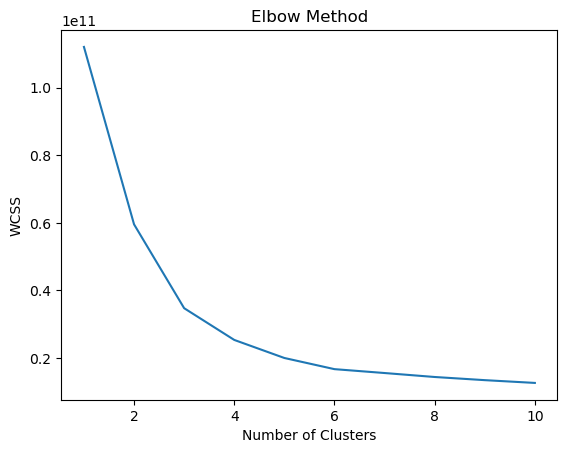

In [31]:
wcss = []  # Initialize an empty list to store within-cluster sum of squares

# Loop through a range of cluster numbers from 1 to 10
for i in range(1, 11):
    # Instantiate a KMeans clustering model with 'i' clusters
    kmeans = KMeans(n_clusters=i, random_state=42)
    
    # Fit the KMeans model to the data
    kmeans.fit(X)
    
    # Append the within-cluster sum of squares (inertia) to the list
    wcss.append(kmeans.inertia_)

# Plot the number of clusters against the within-cluster sum of squares
plt.plot(range(1, 11), wcss)
plt.title("Elbow Method")  # Set plot title
plt.xlabel('Number of Clusters')  # Set x-axis label
plt.ylabel("WCSS")  # Set y-axis label
plt.show()  # Display the plot


**Selecting k=3 is appropriate as, in order to meet the requirements, we must build three clusters. The Elbow technique also demonstrates this.**

In [32]:
kmeans = KMeans(n_clusters=3, init='k-means++', random_state = 42)

In [33]:
kmeans.fit(X)

KMeans(n_clusters=3, random_state=42)

In [34]:
y_kmeans = kmeans.fit_predict(df1)

y_kmeans

array([1, 1, 1, ..., 2, 2, 2])

In [35]:
print(kmeans.labels_)

[1 1 1 ... 2 2 2]


In [36]:
#starting the cluster numbering at 0 rather than 1.
y_kmeans1=y_kmeans+1

In [37]:
# The cluster is a new list.
cluster = list(y_kmeans1)
# A cluster is added to our dataset.
df['cluster'] = cluster

In [38]:
# Identify non-numeric columns
non_numeric_columns = df.select_dtypes(exclude=['number']).columns

# Drop non-numeric columns from the DataFrame
numeric_df = df.drop(columns=non_numeric_columns)

# Calculate the mean across clusters
kmeans_mean_cluster = pd.DataFrame(round(numeric_df.groupby('cluster').mean(), 1))
kmeans_mean_cluster


,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF OTHERS,DACOITY,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,Total crimes against women,Total crimes against children,Total crimes against SCs,Total crimes against STs
cluster,,,,,,,,,,,,,,,,,,,,,
1,2007.7,174.9,165.4,19.6,101.7,0.0,101.7,219.4,76.0,28.4,...,21.3,1998.2,37.5,439.2,5581.5,17239.8,1344.6,104.4,63.9,9.5
2,2007.0,83.5,77.5,9.7,50.6,0.0,50.6,74.4,18.6,12.6,...,26.3,781.1,21.4,233.2,2070.3,5113.3,467.9,145.9,90.2,17.3
3,2006.5,30.2,24.5,3.2,17.2,0.0,17.2,21.9,5.1,4.4,...,8.3,214.9,5.9,66.7,677.9,1544.2,124.3,85.9,64.1,11.4


**The mean value for each cluster for each offense is shown in the clusters above.**

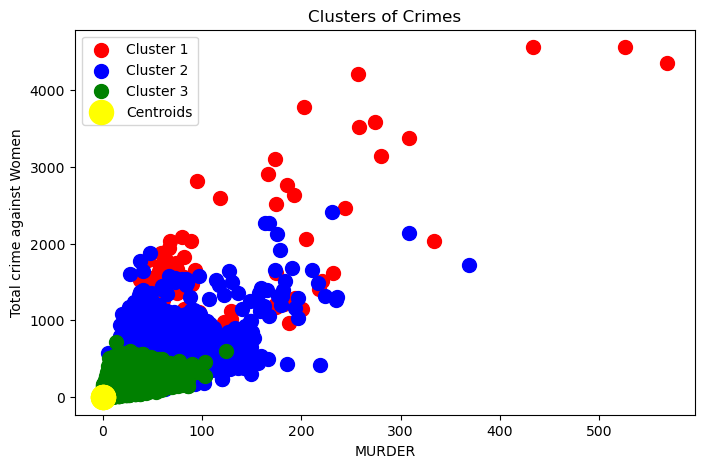

In [39]:
plt.figure(figsize=(8, 5))

# Define colors and labels for clusters
colors = ['red', 'blue', 'green']
labels = ['Cluster 1', 'Cluster 2', 'Cluster 3']

# Plot data points for each cluster
for i in range(1, 4):
    plt.scatter(X[y_kmeans1 == i]['RAPE'], X[y_kmeans1 == i]['Total crimes against women'], s=100, c=colors[i-1], label=labels[i-1])

# Plot centroids
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='yellow', label='Centroids')

# Add title and labels
plt.title('Clusters of Crimes')
plt.xlabel('MURDER')
plt.ylabel('Total crime against Women')
plt.legend()

# Save and show the plot
plt.savefig('clusterscatter.jpg')
plt.show()


"The cluster visualization showcases the relationship between total crimes against women and incidents of rape. Notably, the green data points appear noticeably distant from the centroids, suggesting that Cluster 3 exhibits a higher incidence of crimes.

On the other hand, the proximity of the red data points from Cluster 1 to the centroid implies a moderate crime rate within this cluster.

Likewise, the blue data points from Cluster 2 are positioned closer to the centroids, indicating a comparatively lower crime rate."

**Ploting some graps for beter visualization**

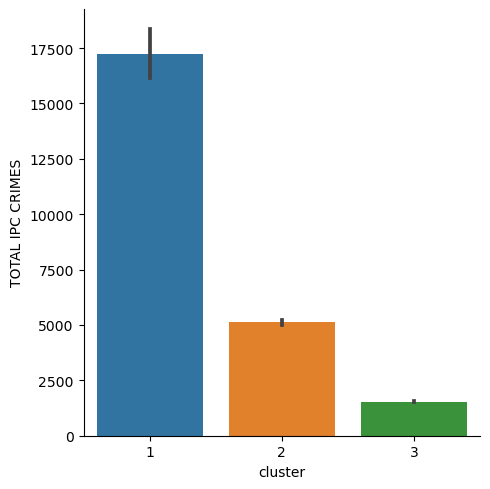

In [40]:
sns.catplot(x='cluster', y='TOTAL IPC CRIMES', data=df, kind='bar');
plt.savefig('clustercatplot.jpg')

We may name the clusters according to the requirements since, according to the above cat plot, Cluster 3 has the lowest TOTAL IPC CRIMES and Cluster 1 has the greatest IPC CRIMES.

<Axes: xlabel='MURDER', ylabel='ATTEMPT TO MURDER'>

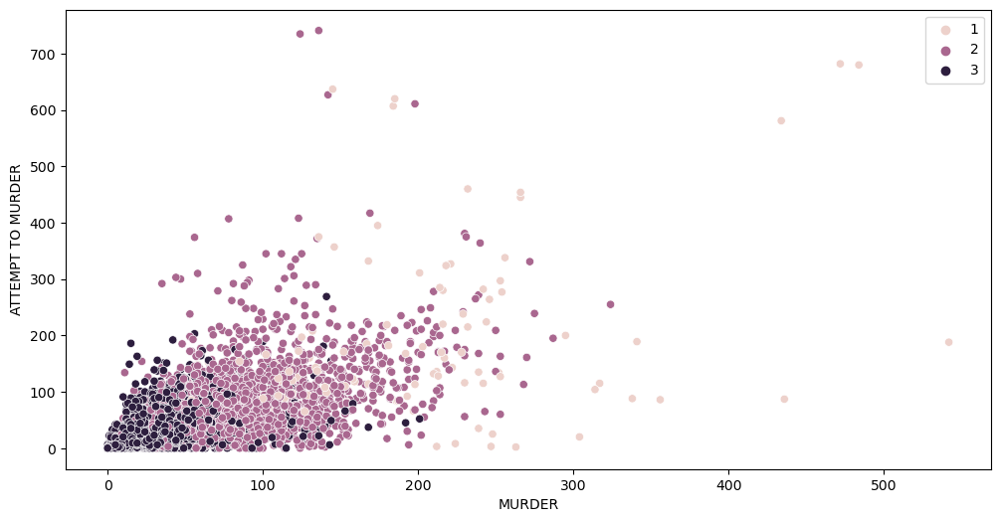

In [41]:
## Making a scatterplot. 
plt.figure(figsize=(12,6))
sns.scatterplot(x=df['MURDER'], y = df['ATTEMPT TO MURDER'],hue=y_kmeans1)

The distribution of the states is depicted in the scatter above, with obvious clusters based on Murders and ATTEMPT to Murder. Additionally, there is a significant association among states between the incidence of murder and murder attempts.

**After dividing the data according to the cluster value, it will be analyzed and labelled as sensitive, moderate, or peacefu**

In [42]:
data1=df[df['cluster']==1]
data2=df[df['cluster']==2]
data3=df[df['cluster']==3]

# District-by-district Grouping and Then Looking for the Maximum Values for Each Column

In [43]:
data3.groupby('DISTRICT').max()

,STATE/UT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF OTHERS,...,HURT/GREVIOUS HURT,DOWRY DEATHS,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,Total crimes against women,Total crimes against children,Total crimes against SCs,Total crimes against STs,cluster
DISTRICT,,,,,,,,,,,,,,,,,,,,,
A and N ISLANDS,A & N ISLANDS,2007.0,15.0,19.0,1.0,3.0,0.0,3.0,12.0,3.0,...,99.0,1.0,4.0,337.0,807.0,54.0,20.0,4,5,3
AHMEDABAD RURAL,GUJARAT,2012.0,63.0,33.0,8.0,12.0,0.0,12.0,74.0,12.0,...,518.0,7.0,467.0,2308.0,4006.0,268.0,144.0,138,10,3
AHWA-DANG,GUJARAT,2012.0,11.0,3.0,0.0,5.0,0.0,5.0,2.0,1.0,...,34.0,1.0,31.0,188.0,292.0,20.0,156.0,95,9,3
AIZAWL,MIZORAM,2012.0,23.0,24.0,6.0,42.0,0.0,42.0,7.0,7.0,...,51.0,0.0,30.0,665.0,1871.0,94.0,18.0,0,2,3
AKOLA,MAHARASHTRA,2012.0,64.0,52.0,3.0,29.0,0.0,29.0,29.0,5.0,...,843.0,9.0,172.0,1306.0,4222.0,339.0,106.0,49,15,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WEST,TRIPURA,2012.0,136.0,30.0,1.0,77.0,0.0,77.0,63.0,47.0,...,277.0,22.0,114.0,589.0,1942.0,475.0,288.0,38,11,3
WOKHA,NAGALAND,2012.0,12.0,7.0,1.0,3.0,0.0,3.0,4.0,2.0,...,10.0,0.0,4.0,24.0,99.0,4.0,40.0,2,90,3
YADGIRI,KARNATAKA,2012.0,26.0,51.0,0.0,9.0,0.0,9.0,26.0,26.0,...,353.0,3.0,135.0,613.0,1592.0,198.0,188.0,39,0,3


In [44]:
data3.groupby('DISTRICT').min()

,STATE/UT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF OTHERS,...,HURT/GREVIOUS HURT,DOWRY DEATHS,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,Total crimes against women,Total crimes against children,Total crimes against SCs,Total crimes against STs,cluster
DISTRICT,,,,,,,,,,,,,,,,,,,,,
A and N ISLANDS,A & N ISLANDS,2007.0,15.0,19.0,1.0,3.0,0.0,3.0,12.0,3.0,...,99.0,1.0,4.0,337.0,807.0,54.0,20.0,4,5,3
AHMEDABAD RURAL,GUJARAT,2001.0,19.0,4.0,0.0,3.0,0.0,3.0,13.0,0.0,...,236.0,0.0,183.0,797.0,2146.0,96.0,0.0,0,0,3
AHWA-DANG,GUJARAT,2001.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,10.0,0.0,10.0,43.0,104.0,3.0,32.0,0,0,3
AIZAWL,MIZORAM,2001.0,4.0,4.0,0.0,6.0,0.0,6.0,0.0,0.0,...,11.0,0.0,0.0,94.0,534.0,22.0,0.0,0,0,3
AKOLA,MAHARASHTRA,2001.0,38.0,34.0,0.0,15.0,0.0,15.0,15.0,0.0,...,720.0,1.0,116.0,998.0,3442.0,261.0,32.0,9,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WEST,SIKKIM,2001.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5.0,0.0,0.0,4.0,50.0,3.0,0.0,0,0,3
WOKHA,NAGALAND,2001.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,0.0,0.0,4.0,47.0,0.0,0.0,0,0,3
YADGIRI,KARNATAKA,2010.0,23.0,21.0,0.0,5.0,0.0,5.0,20.0,2.0,...,289.0,0.0,5.0,449.0,1486.0,123.0,50.0,4,0,3


Observations

Data1 falls into the sensitive area because it contains fewer rows but the highest crime values. It is tiny because the total count is high, but we can see that the maximum values for each column (crime) are the highest.

**Creating a senstivearea dataframe (with cluster value 1) from data1.**

In [45]:
sensitivearea=df[df['cluster']==1]

# Verifying data2

In [46]:
data2.groupby('DISTRICT').max()

,STATE/UT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF OTHERS,...,HURT/GREVIOUS HURT,DOWRY DEATHS,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,Total crimes against women,Total crimes against children,Total crimes against SCs,Total crimes against STs,cluster
DISTRICT,,,,,,,,,,,,,,,,,,,,,
24 PARGANAS NORTH,WEST BENGAL,2007.0,204.0,70.0,61.0,231.0,0.0,231.0,236.0,58.0,...,281.0,71.0,113.0,4228.0,9201.0,2405.0,4.0,99,1,2
24 PARGANAS SOUTH,WEST BENGAL,2006.0,140.0,8.0,75.0,190.0,0.0,190.0,155.0,12.0,...,390.0,68.0,67.0,3818.0,7396.0,1677.0,0.0,1,2,2
ADILABAD,ANDHRA PRADESH,2012.0,113.0,94.0,17.0,88.0,0.0,88.0,96.0,30.0,...,2172.0,22.0,400.0,2265.0,6122.0,919.0,180.0,74,18,2
AGRA,UTTAR PRADESH,2010.0,158.0,190.0,55.0,66.0,0.0,66.0,252.0,71.0,...,573.0,83.0,591.0,2085.0,6925.0,1013.0,220.0,376,35,2
AHMEDNAGAR,MAHARASHTRA,2012.0,134.0,108.0,6.0,78.0,0.0,78.0,82.0,23.0,...,802.0,32.0,744.0,1918.0,7648.0,1011.0,250.0,4214,1501,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WARANGAL URBAN,ANDHRA PRADESH,2011.0,46.0,10.0,5.0,35.0,0.0,35.0,55.0,40.0,...,499.0,26.0,230.0,1730.0,3797.0,271.0,4426.0,96,57,2
WARDHA,MAHARASHTRA,2010.0,41.0,29.0,5.0,44.0,0.0,44.0,26.0,4.0,...,808.0,5.0,205.0,1513.0,4369.0,337.0,208.0,21,41,2
WEST,TRIPURA,2011.0,83.0,25.0,6.0,118.0,0.0,118.0,73.0,17.0,...,609.0,23.0,119.0,804.0,2709.0,720.0,428.0,20,35,2


In [47]:
data2.groupby('DISTRICT').min()

,STATE/UT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF OTHERS,...,HURT/GREVIOUS HURT,DOWRY DEATHS,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,Total crimes against women,Total crimes against children,Total crimes against SCs,Total crimes against STs,cluster
DISTRICT,,,,,,,,,,,,,,,,,,,,,
24 PARGANAS NORTH,WEST BENGAL,2001.0,168.0,6.0,38.0,53.0,0.0,53.0,81.0,0.0,...,0.0,23.0,0.0,3036.0,6167.0,649.0,0.0,0,0,2
24 PARGANAS SOUTH,WEST BENGAL,2001.0,107.0,2.0,34.0,47.0,0.0,47.0,53.0,1.0,...,0.0,43.0,0.0,3211.0,5827.0,681.0,0.0,0,0,2
ADILABAD,ANDHRA PRADESH,2001.0,73.0,39.0,8.0,35.0,0.0,35.0,41.0,6.0,...,1044.0,5.0,181.0,881.0,4154.0,454.0,0.0,14,0,2
AGRA,UTTAR PRADESH,2001.0,109.0,116.0,18.0,26.0,0.0,26.0,99.0,26.0,...,360.0,38.0,40.0,896.0,3438.0,452.0,26.0,4,0,2
AHMEDNAGAR,MAHARASHTRA,2001.0,81.0,38.0,0.0,41.0,0.0,41.0,25.0,7.0,...,575.0,0.0,445.0,975.0,4251.0,404.0,12.0,13,4,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WARANGAL URBAN,ANDHRA PRADESH,2011.0,46.0,10.0,5.0,35.0,0.0,35.0,55.0,40.0,...,499.0,26.0,230.0,1730.0,3797.0,271.0,4426.0,96,57,2
WARDHA,MAHARASHTRA,2008.0,36.0,27.0,3.0,26.0,0.0,26.0,26.0,4.0,...,744.0,2.0,176.0,1197.0,3882.0,333.0,54.0,17,18,2
WEST,TRIPURA,2008.0,61.0,14.0,0.0,76.0,0.0,76.0,48.0,6.0,...,362.0,6.0,6.0,641.0,2420.0,591.0,154.0,2,3,2


In [48]:
data2.shape

(2295, 33)

Observation

There is peace in this area because data2 (cluster value 2) contains 2295 rows with lower maximum values than data3 value and lower values than data1 (cluster value 3).

In [49]:
peacefularea=df[df['cluster']==2] 

**We have a sensitive, peaceful location, hence data1 with cluster value 2 will be our moderate area.**

**Cluster 2 data analysis by district grouping**

In [50]:
moderatearea=df[df['cluster']==2] 

In [51]:
data1.groupby('DISTRICT').max()

,STATE/UT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF OTHERS,...,HURT/GREVIOUS HURT,DOWRY DEATHS,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,Total crimes against women,Total crimes against children,Total crimes against SCs,Total crimes against STs,cluster
DISTRICT,,,,,,,,,,,,,,,,,,,,,
24 PARGANAS NORTH,WEST BENGAL,2012.0,244.0,238.0,241.0,203.0,0.0,203.0,587.0,173.0,...,349.0,88.0,17.0,7918.0,17412.0,3780.0,90.0,68,3,1
24 PARGANAS SOUTH,WEST BENGAL,2012.0,263.0,123.0,48.0,308.0,0.0,308.0,419.0,65.0,...,292.0,67.0,131.0,7641.0,15299.0,3583.0,58.0,10,5,1
AGRA,UTTAR PRADESH,2012.0,181.0,182.0,40.0,76.0,0.0,76.0,395.0,67.0,...,411.0,88.0,515.0,2509.0,10290.0,1028.0,226.0,76,30,1
AHMEDABAD COMMR.,GUJARAT,2012.0,222.0,143.0,60.0,63.0,0.0,63.0,230.0,93.0,...,1594.0,19.0,252.0,12112.0,21442.0,1791.0,32.0,83,13,1
ALWAR,RAJASTHAN,2012.0,100.0,88.0,7.0,129.0,0.0,129.0,243.0,89.0,...,2612.0,47.0,503.0,2620.0,11941.0,1120.0,136.0,181,26,1
BANGALORE COMMR.,KARNATAKA,2012.0,266.0,460.0,8.0,97.0,1.0,97.0,573.0,484.0,...,4029.0,54.0,170.0,12547.0,32380.0,1470.0,182.0,150,24,1
CHENNAI,TAMIL NADU,2012.0,180.0,332.0,4.0,94.0,0.0,94.0,87.0,22.0,...,1466.0,20.0,1431.0,12464.0,21346.0,639.0,34.0,36,0,1
CYBERABAD,ANDHRA PRADESH,2012.0,213.0,128.0,17.0,95.0,0.0,95.0,168.0,93.0,...,4028.0,59.0,1188.0,3155.0,17979.0,2815.0,14.0,213,28,1
GHAZIABAD,UTTAR PRADESH,2010.0,254.0,277.0,35.0,53.0,0.0,53.0,491.0,170.0,...,53.0,69.0,1166.0,3123.0,11821.0,1266.0,58.0,53,0,1


In [52]:
data1.groupby('DISTRICT').min()

,STATE/UT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF OTHERS,...,HURT/GREVIOUS HURT,DOWRY DEATHS,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,Total crimes against women,Total crimes against children,Total crimes against SCs,Total crimes against STs,cluster
DISTRICT,,,,,,,,,,,,,,,,,,,,,
24 PARGANAS NORTH,WEST BENGAL,2006.0,140.0,82.0,39.0,118.0,0.0,118.0,186.0,46.0,...,79.0,54.0,3.0,3200.0,7776.0,1617.0,0.0,32,0,1
24 PARGANAS SOUTH,WEST BENGAL,2007.0,158.0,2.0,25.0,205.0,0.0,205.0,128.0,0.0,...,207.0,43.0,4.0,3787.0,8856.0,2057.0,0.0,0,0,1
AGRA,UTTAR PRADESH,2011.0,152.0,171.0,38.0,58.0,0.0,58.0,321.0,66.0,...,377.0,87.0,397.0,2177.0,9360.0,855.0,214.0,22,29,1
AHMEDABAD COMMR.,GUJARAT,2001.0,76.0,44.0,0.0,12.0,0.0,12.0,143.0,26.0,...,1165.0,1.0,0.0,5953.0,13496.0,597.0,0.0,0,0,1
ALWAR,RAJASTHAN,2012.0,100.0,88.0,7.0,129.0,0.0,129.0,243.0,89.0,...,2612.0,47.0,503.0,2620.0,11941.0,1120.0,136.0,181,26,1
BANGALORE COMMR.,KARNATAKA,2001.0,201.0,264.0,1.0,32.0,0.0,32.0,99.0,70.0,...,2381.0,33.0,38.0,7665.0,26284.0,544.0,0.0,50,0,1
CHENNAI,TAMIL NADU,2011.0,168.0,219.0,1.0,76.0,0.0,76.0,56.0,15.0,...,1412.0,12.0,1411.0,12131.0,19881.0,560.0,8.0,11,0,1
CYBERABAD,ANDHRA PRADESH,2005.0,150.0,66.0,3.0,44.0,0.0,44.0,141.0,40.0,...,3033.0,34.0,898.0,1397.0,12079.0,1055.0,0.0,125,4,1
GHAZIABAD,UTTAR PRADESH,2009.0,216.0,220.0,31.0,44.0,0.0,44.0,366.0,81.0,...,45.0,66.0,456.0,2007.0,10217.0,1011.0,42.0,45,0,1


# 4.2 For every cluster, creating a DataFrame that displays data based on the areas.

**3 datasets were created based on the cluster value and given the following names.**

Cluster 3: Sensitive Area;
Cluster 1: Moderate Area;
Cluster 2: Peaceful Area

**Making the Clusters Visible**

In [53]:
kmeans.cluster_centers_

array([[ 3.16569767e-01,  2.97938862e+00,  2.44036248e+00,
         1.43434158e+00,  2.41173251e+00,  5.47080349e-02,
         2.41191194e+00,  3.60966788e+00,  3.63418468e+00,
         1.93552055e+00,  2.89886578e+00,  4.38259039e+00,
         4.20800765e+00,  5.45354495e+00,  5.11370295e+00,
         5.05065928e+00,  2.21859877e+00,  4.52970893e+00,
         4.80631402e+00,  3.72742727e+00,  2.55322491e-01,
         2.83926869e+00,  1.88222126e+00,  2.05206986e+00,
         3.08626360e+00,  4.71647276e+00,  3.79035336e+00,
         3.79638446e-03, -2.21638817e-02, -5.47892562e-02],
       [ 9.81207861e-02,  8.50461279e-01,  7.12892699e-01,
         4.47161261e-01,  7.46988528e-01,  5.39364232e-02,
         7.46947749e-01,  7.01933610e-01,  4.75845262e-01,
         5.06402277e-01,  1.61295824e-01,  4.50884253e-01,
         5.11227262e-01,  3.58817362e-01,  3.12024026e-01,
         3.50746203e-01,  6.27430514e-01,  4.31397141e-01,
         4.03211173e-01,  2.18899640e-01,  4.18214056e-

In [54]:
## defining the STATE/UT, YEAR, and DISTRICT columns for each cluster's countplot function
def generate_countplot(x):
    plt.figure(figsize=(10,7))
    sns.countplot(x)
    plt.xticks(rotation=90)
    plt.tight_layout()
    return plt.show()

col1 = ['STATE/UT', 'YEAR']

Countplot for STATE/UT column:->


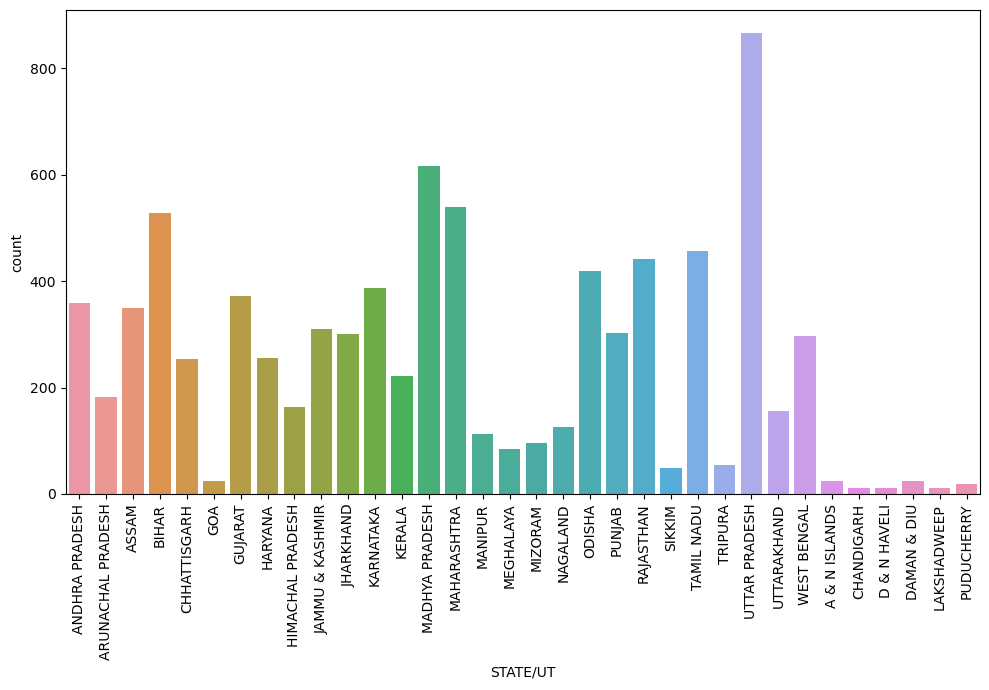

Countplot for YEAR column:->


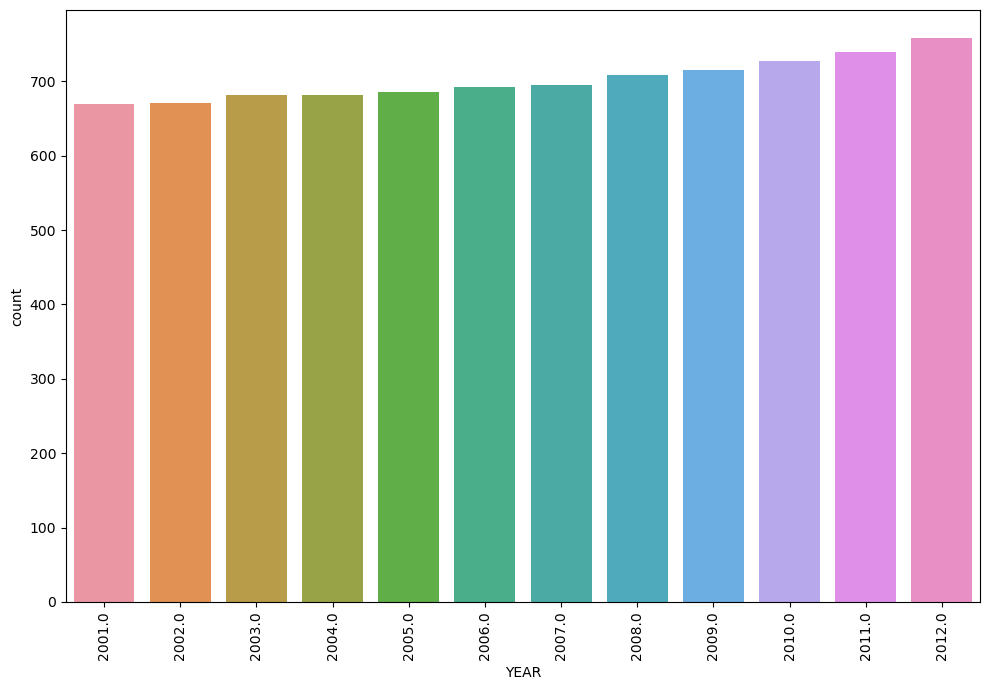

In [55]:
for i in sensitivearea[col1]:
    print("Countplot for {} column:->".format(i))
    plt.figure(figsize=(10, 7))
    sns.countplot(x=i, data=df)
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()


**States with very few rows, such as Goa, Tripura, Mizoram, and Sikkim, indicate that they are safer than other states.**

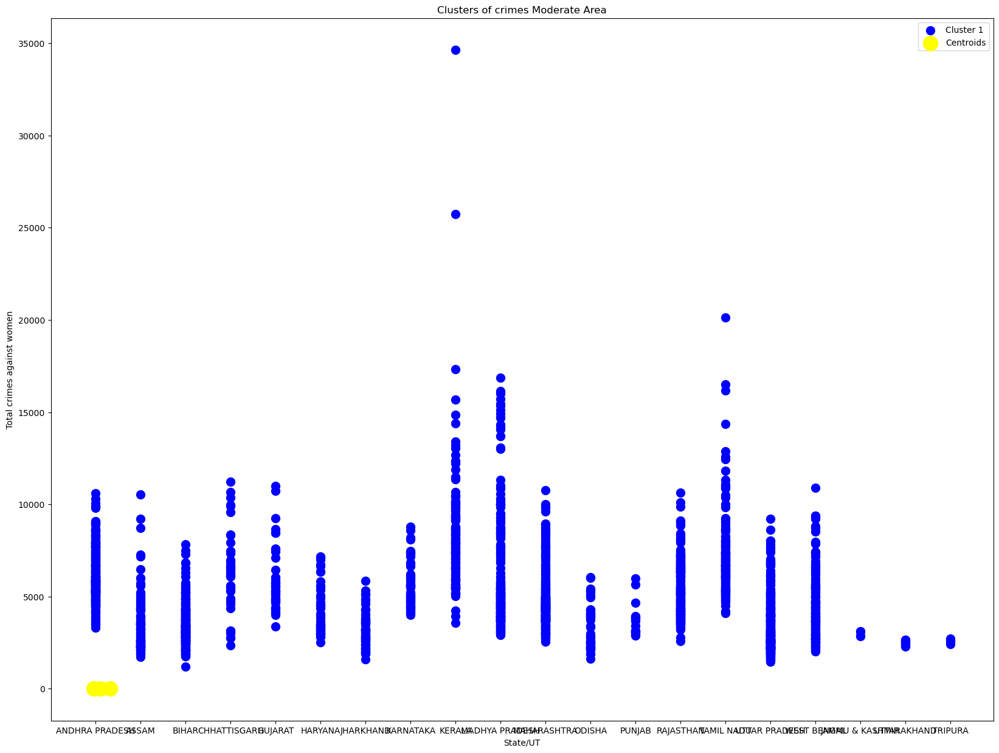

In [56]:
plt.figure(figsize=(20,15))
plt.scatter(moderatearea['STATE/UT'], moderatearea['TOTAL IPC CRIMES'], s = 100, c = 'blue', label = 'Cluster 1'),#hue=data2['STATE/UT'])
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s = 300, c = 'yellow', label = 'Centroids')
plt.title('Clusters of crimes Moderate Area')
plt.xlabel('State/UT')
plt.ylabel('Total crimes against women')
plt.legend()
plt.show()

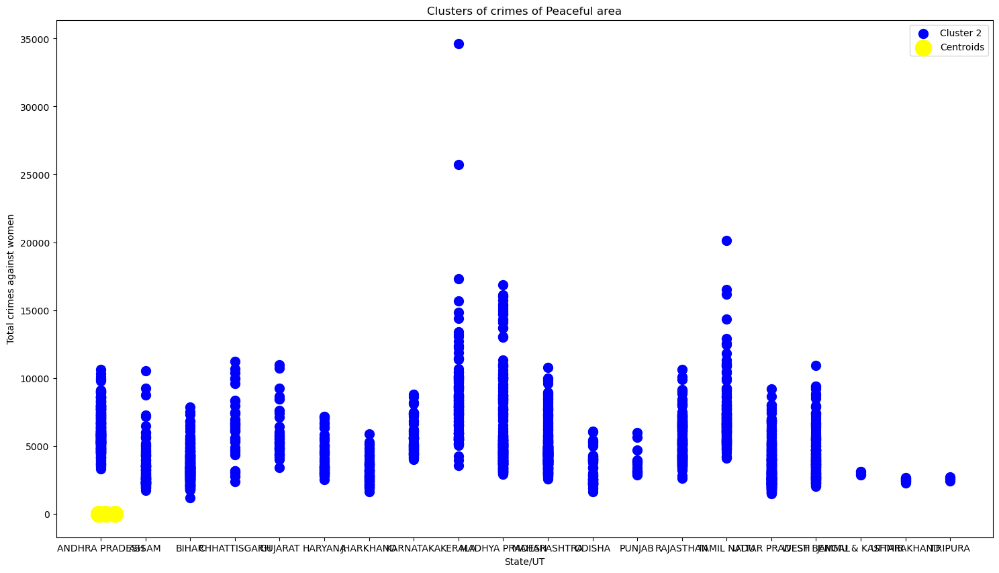

In [57]:
plt.figure(figsize=(18,10))
plt.scatter(peacefularea['STATE/UT'], peacefularea['TOTAL IPC CRIMES'], s = 100, c = 'blue', label = 'Cluster 2'),#hue=data2['STATE/UT'])
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s = 300, c = 'yellow', label = 'Centroids')
plt.title('Clusters of crimes of Peaceful area')
plt.xlabel('State/UT')
plt.ylabel('Total crimes against women')
plt.legend()
plt.show()

In [58]:
from sklearn.metrics import silhouette_score

# 4.3 Examining our clusters and writing a report outlining all of our findings.

# Sensitive Area Analysis

In [59]:
pd.pivot_table(sensitivearea, values =['MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS',  'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES',
       'Total crimes against women', 'Total crimes against children',
       'Total crimes against SCs', 'Total crimes against STs'], index =['STATE/UT','DISTRICT', 'YEAR'],
                          aggfunc = max)
#'Year' and 'State' features in a pivot table that illustrates a specific crime

ARSON  ATTEMPT TO MURDER  AUTO THEFT  \
STATE/UT       DISTRICT    YEAR                                           
ANDHRA PRADESH CYBERABAD   2005.0   37.0               88.0       563.0   
                           2006.0   43.0               92.0       642.0   
                           2007.0   74.0               84.0      1124.0   
                           2008.0   42.0               66.0      1202.0   
                           2009.0   71.0               84.0      1365.0   
...                                  ...                ...         ...   
WEST BENGAL    MURSHIDABAD 2010.0   54.0              620.0       204.0   
                           2011.0   45.0              637.0       186.0   
                           2012.0   50.0              395.0       309.0   
               NADIA       2011.0   13.0              375.0       243.0   
                           2012.0   22.0              357.0       244.0   

                                   BURGLARY  CAUSING DEATH BY NEGLIGENCE  \
STATE/UT       DISTRICT    YEAR                                            
ANDHRA PRADESH CYBERABAD   2005.0    1139.0                        898.0   
                           2006.0    1321.0                       1064.0   
                           2007.0    1165.0                       1188.0   
                           2008.0    1319.0                       1166.0   
                           2009.0    1348.0                       1063.0   
...                                     ...                          ...   
WEST BENGAL    MURSHIDABAD 2010.0       7.0                        311.0   
                           2011.0      13.0                        290.0   
                           2012.0       4.0                        347.0   
               NADIA       2011.0      20.0                        156.0   
                           2012.0      21.0                        285.0   

                                   CHEATING  COUNTERFIETING  \
STATE/UT       DISTRICT    YEAR                               
ANDHRA PRADESH CYBERABAD   2005.0     950.0             5.0   
                           2006.0    1275.0             6.0   
                           2007.0    1192.0             5.0   
                           2008.0    1183.0             6.0   
                           2009.0    1174.0            13.0   
...                                     ...             ...   
WEST BENGAL    MURSHIDABAD 2010.0     170.0            30.0   
                           2011.0     189.0            27.0   
                           2012.0     157.0           110.0   
               NADIA       2011.0     291.0            11.0   
                           2012.0     338.0            21.0   

                                   CRIMINAL BREACH OF TRUST  \
STATE/UT       DISTRICT    YEAR                               
ANDHRA PRADESH CYBERABAD   2005.0                      83.0   
                           2006.0                     156.0   
                           2007.0                     103.0   
                           2008.0                     103.0   
                           2009.0                     124.0   
...                                                     ...   
WEST BENGAL    MURSHIDABAD 2010.0                      54.0   
                           2011.0                      96.0   
                           2012.0                      92.0   
               NADIA       2011.0                      99.0   
                           2012.0                     132.0   

                                   CULPABLE HOMICIDE NOT AMOUNTING TO MURDER  \
STATE/UT       DISTRICT    YEAR                                                
ANDHRA PRADESH CYBERABAD   2005.0                                       10.0   
                           2006.0                                       11.0   
                           2007.0                                        8.0   
                           200

In [60]:
print("We have {} Rows and {} Columns in our dataframe Sensitive Area ".format(sensitivearea.shape[0], sensitivearea.shape[1]))

We have 134 Rows and 33 Columns in our dataframe Sensitive Area 


In [61]:
tot_murder= sensitivearea['MURDER'].sum()
tot_rape= sensitivearea['RAPE'].sum()
tot_dowrydeaths = sensitivearea['DOWRY DEATHS'].sum()

tot_riots=sensitivearea['RIOTS'].sum()
tot_kidnap= sensitivearea['KIDNAPPING & ABDUCTION'].sum()
tot_dacoity= sensitivearea['DACOITY'].sum()
tot_robbery = sensitivearea['ROBBERY'].sum()
tot_burglary= sensitivearea['BURGLARY'].sum()
tot_theft= sensitivearea['THEFT'].sum()
tot_crimes_against_women = sensitivearea['Total crimes against women'].sum()
tot_crimes_against_STs = sensitivearea['Total crimes against STs'].sum()
tot_crimes_against_SCs = sensitivearea['Total crimes against SCs'].sum()
tot_crimes_against_children = sensitivearea['Total crimes against children'].sum()


crime_group = ['TOTAL Murder','TOTAL rape','Total Dowry Deaths','Total Kidnapping','TOTAL Dacoity','Total Robbery','TOtal Burglary','Total Theft','Total Riots',
                'Total Crimes Against Women','Total Crimes Against SC','Total Crimes against STs','Total Crimes Against Children']
values = [tot_murder,tot_rape,tot_dowrydeaths,tot_kidnap,tot_dacoity,tot_robbery,tot_burglary,
          tot_theft,tot_riots,tot_crimes_against_women,tot_crimes_against_STs,tot_crimes_against_SCs,tot_crimes_against_children]

colors = ['crimson','gold','green','yellow','blue','black']

The total percentage of theft is 37.1%, but the total percentage of crimes against SCs is lower at 0.878%.

In [62]:
sensitivearea['STATE/UT'].value_counts()

STATE/UT
WEST BENGAL       28
MAHARASHTRA       25
ANDHRA PRADESH    20
BIHAR             12
GUJARAT           12
KARNATAKA         12
UTTAR PRADESH     12
RAJASTHAN          6
MADHYA PRADESH     5
TAMIL NADU         2
Name: count, dtype: int64

**All States/UT**

Eleven states have higher crime rates, with total IPC offenses, total crimes against women, and total crimes against STs and SCs being the most notable.
Cause of the states' greater crime rates:

As West Bengal, Maharashtra, Andhra Pradesh, Rajasthan, and Uttar Pradesh are large states with significant population densities, these states have higher crime rates.

There should be fewer crimes and a greater literacy rate.

In [63]:
sensitivearea['DISTRICT'].value_counts()

DISTRICT
HYDERABAD CITY       12
AHMEDABAD COMMR.     12
BANGALORE COMMR.     12
PATNA                12
KOLKATA               9
CYBERABAD             8
PUNE COMMR.           8
LUCKNOW               7
MUMBAI COMMR.         7
24 PARGANAS SOUTH     6
24 PARGANAS NORTH     6
JAIPUR                5
MUMBAI                5
INDORE                5
THANE COMMR.          5
MURSHIDABAD           4
GHAZIABAD             2
CHENNAI               2
AGRA                  2
NADIA                 2
KANPUR NAGAR          1
JALPAIGURI            1
ALWAR                 1
Name: count, dtype: int64

In [64]:
sensitivearea_dis=sensitivearea.groupby('DISTRICT')

In [65]:
sensitivearea_dis.first()

,STATE/UT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF OTHERS,...,HURT/GREVIOUS HURT,DOWRY DEATHS,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,Total crimes against women,Total crimes against children,Total crimes against SCs,Total crimes against STs,cluster
DISTRICT,,,,,,,,,,,,,,,,,,,,,
24 PARGANAS NORTH,WEST BENGAL,2006.0,154.0,82.0,39.0,174.0,0.0,174.0,186.0,46.0,...,349.0,74.0,3.0,3200.0,7776.0,1617.0,90.0,68,1,1
24 PARGANAS SOUTH,WEST BENGAL,2007.0,158.0,123.0,48.0,205.0,0.0,205.0,241.0,65.0,...,218.0,67.0,4.0,3787.0,8856.0,2057.0,0.0,0,0,1
AGRA,UTTAR PRADESH,2011.0,181.0,182.0,38.0,76.0,0.0,76.0,395.0,67.0,...,411.0,87.0,515.0,2509.0,10290.0,1028.0,226.0,22,30,1
AHMEDABAD COMMR.,GUJARAT,2001.0,90.0,58.0,60.0,39.0,0.0,39.0,143.0,26.0,...,1311.0,7.0,0.0,6129.0,13496.0,774.0,8.0,73,0,1
ALWAR,RAJASTHAN,2012.0,100.0,88.0,7.0,129.0,0.0,129.0,243.0,89.0,...,2612.0,47.0,503.0,2620.0,11941.0,1120.0,136.0,181,26,1
BANGALORE COMMR.,KARNATAKA,2001.0,221.0,327.0,5.0,40.0,0.0,40.0,152.0,96.0,...,3735.0,40.0,38.0,11106.0,27254.0,639.0,6.0,94,7,1
CHENNAI,TAMIL NADU,2011.0,168.0,332.0,1.0,76.0,0.0,76.0,56.0,15.0,...,1466.0,20.0,1431.0,12464.0,21346.0,560.0,8.0,11,0,1
CYBERABAD,ANDHRA PRADESH,2005.0,150.0,88.0,10.0,44.0,0.0,44.0,151.0,93.0,...,3033.0,34.0,898.0,2086.0,12079.0,1055.0,0.0,159,21,1
GHAZIABAD,UTTAR PRADESH,2009.0,254.0,277.0,31.0,53.0,0.0,53.0,491.0,170.0,...,53.0,66.0,456.0,3123.0,11821.0,1266.0,58.0,45,0,1


In [66]:
sensitivearea.describe().T

,count,mean,std,min,25%,50%,75%,max
YEAR,134.0,2007.723881,3.363653,2001.0,2005.00,2008.0,2011.00,2012.0
MURDER,134.0,174.888060,91.831544,37.0,110.00,152.5,223.50,542.0
ATTEMPT TO MURDER,134.0,165.388060,137.303347,2.0,86.00,123.5,184.25,682.0
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,134.0,19.567164,30.616583,0.0,4.25,8.0,28.00,241.0
RAPE,134.0,101.701493,91.303018,12.0,47.25,67.5,121.00,568.0
CUSTODIAL RAPE,134.0,0.007463,0.086387,0.0,0.00,0.0,0.00,1.0
OTHER RAPE,134.0,101.694030,91.306328,12.0,47.25,67.5,121.00,568.0
KIDNAPPING & ABDUCTION,134.0,219.380597,128.022895,36.0,125.75,180.0,282.25,587.0
KIDNAPPING AND ABDUCTION OF OTHERS,134.0,76.007463,71.744901,0.0,33.25,58.5,83.75,484.0
DACOITY,134.0,28.350746,28.760159,0.0,12.00,21.5,34.75,219.0


**As indicated that the maximum values for each column will fall in a sensitive area when we observed the describe method for the entire dataset, as we can clearly see above.**

# Bar Plotting State versus Total IPC Crime

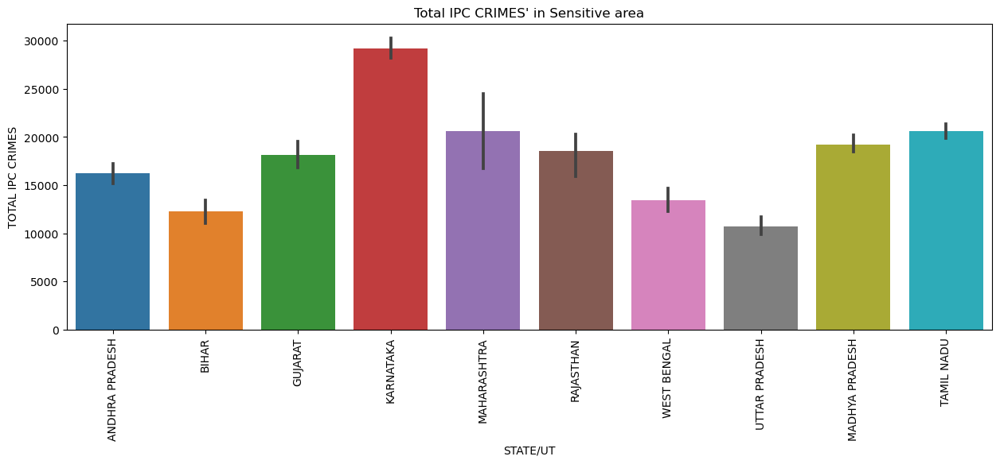

In [67]:
plt.figure(figsize=(15, 5))
sns.barplot(x='STATE/UT', y='TOTAL IPC CRIMES',data=sensitivearea)
plt.xticks(rotation=90)
plt.title("Total IPC CRIMES' in Sensitive area")
plt.show()

IPC crimes, which include murder, attempted murder, culpable homicide, dowry death, kidnapping, and abduction, are primarily found in the states of Karnataka, Maharashtra, and Tamil Nadu. Wherever there are the highest rates of murder, attempted murder, culpable homicide, dowry deaths, kidnapping, and abduction

**Additionally looking for DISTRICTS**

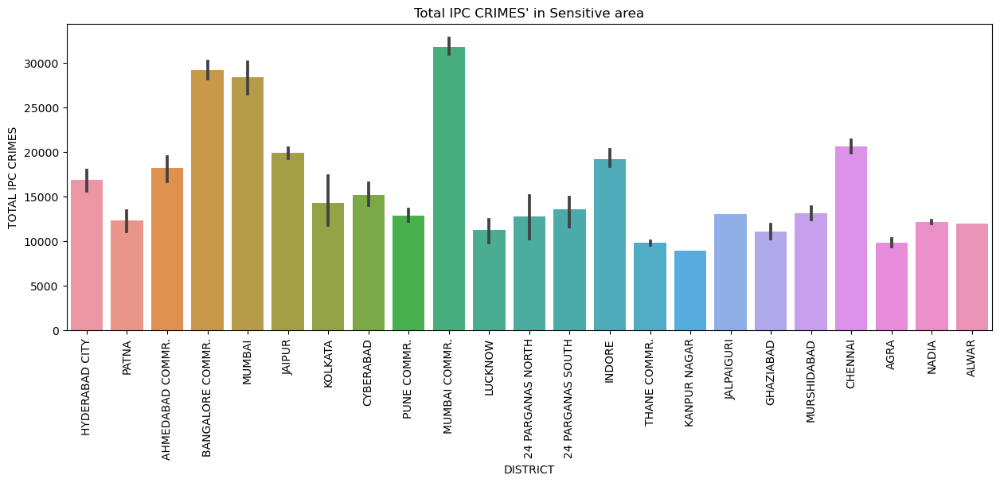

In [68]:
plt.figure(figsize=(15, 5))
sns.barplot(x='DISTRICT', y='TOTAL IPC CRIMES',data=sensitivearea)
plt.xticks(rotation=90)
plt.title("Total IPC CRIMES' in Sensitive area")
plt.savefig('IPC CRIMES in Sensitive area.jpg')
plt.show()

**The top three districts with the highest IPC crimes are Mumbai's commercial area, Ahmedabad's commercial area, and Bangalore's commercial area.**

# Comparison Between Districts against Total Crimes against Women

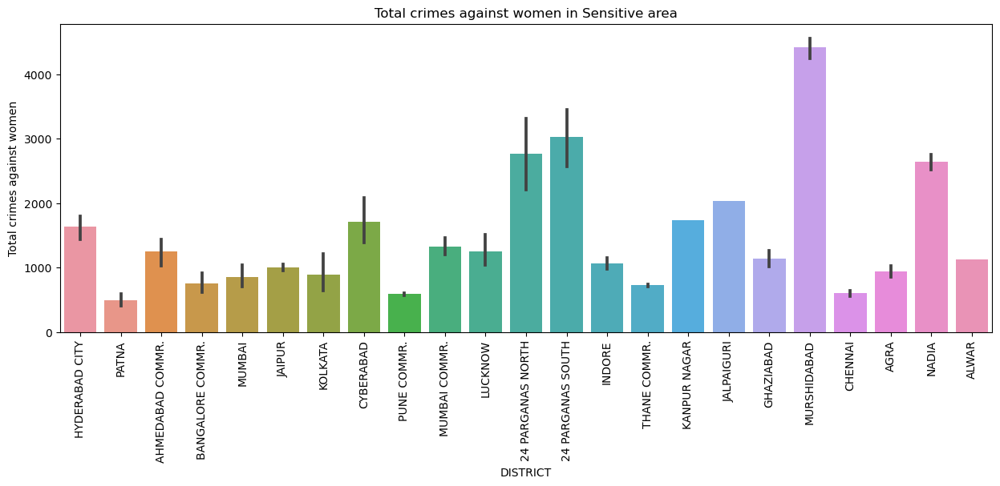

In [69]:
plt.figure(figsize=(15, 5))
sns.barplot(x='DISTRICT', y='Total crimes against women',data=sensitivearea)
plt.xticks(rotation=90)
plt.title("Total crimes against women in Sensitive area")

plt.savefig('Total crimes against women in Sensitive area.jpg')
plt.show()

#**West Bengal is home to the top three districts, which are Murshidabad, 24 Parganas South, and 24 Parganas North. This indicates that these districts of West Bengal for women, is by no means safe.**

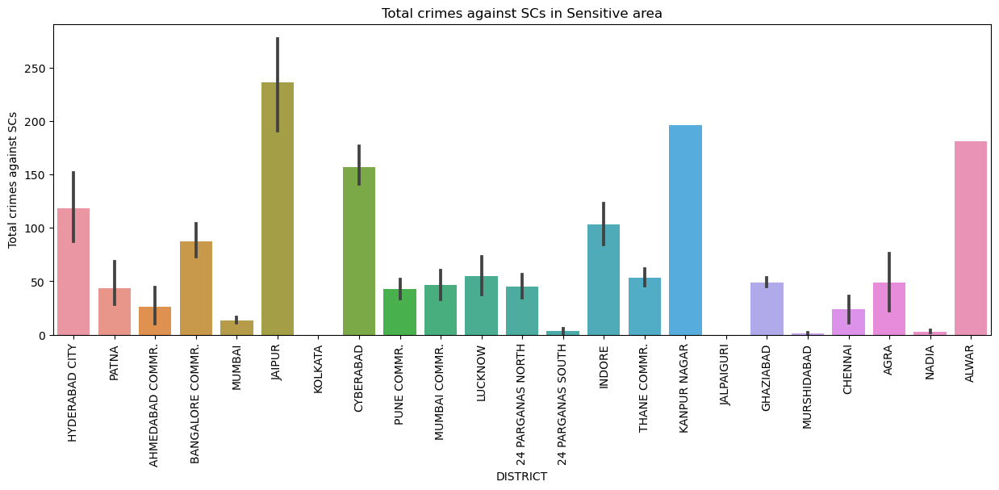

In [70]:
plt.figure(figsize=(15, 5))
sns.barplot(x='DISTRICT', y='Total crimes against SCs',data=sensitivearea)
plt.xticks(rotation=90)
plt.title("Total crimes against SCs in Sensitive area")
plt.savefig('Total crimes against SCs in Sensitive area')
plt.show()

**The biggest number of crimes against SCs in India occurs in Kanpur Nagar in Uttar Pradesh, and the districts of Jaipur and Alwar in Rajasthan State.**

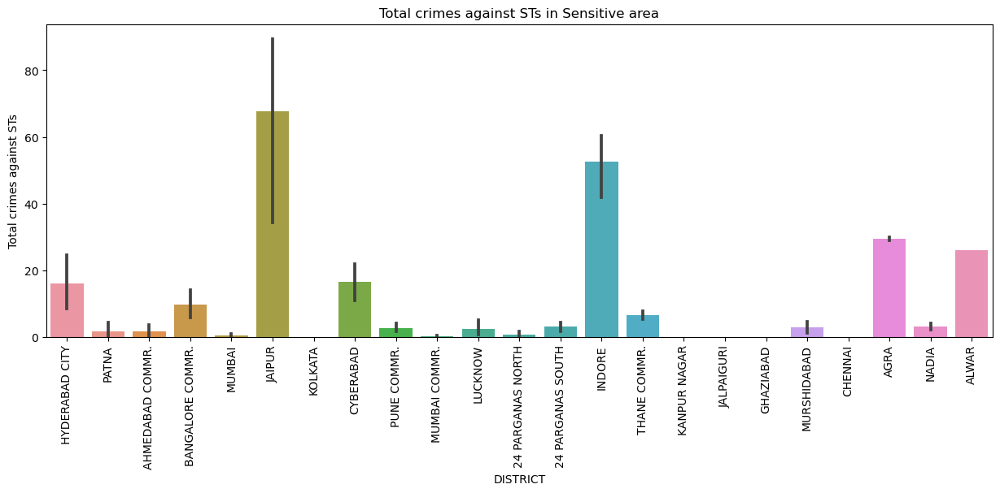

In [71]:
plt.figure(figsize=(15, 5))
sns.barplot(x='DISTRICT', y='Total crimes against STs',data=sensitivearea)
plt.xticks(rotation=90)
plt.title("Total crimes against STs in Sensitive area")
plt.savefig('Total crimes against STs in Sensitive area')
plt.show()

**Crimes against STs are more common in the districts of Jaipur, Rajasthan; Indore of Madhya Pradesh; and Agra, Uttar Pradesh.**

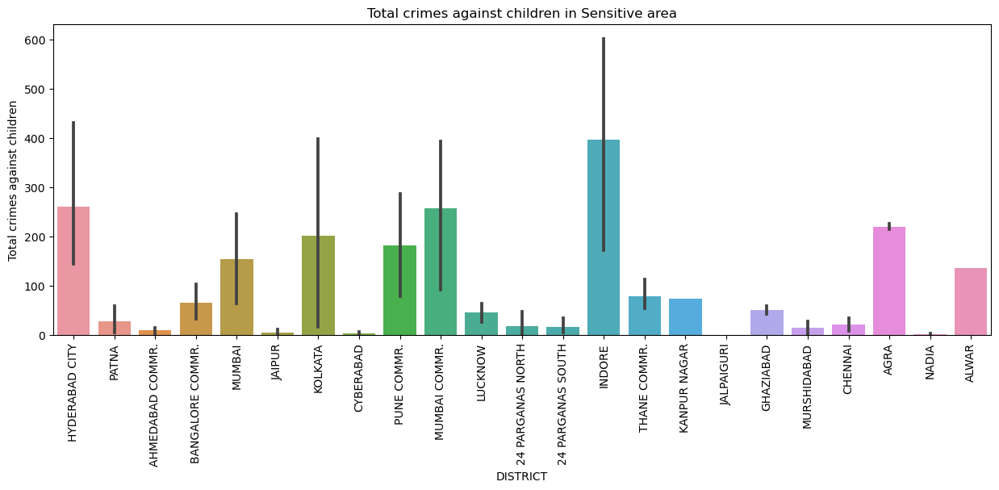

In [72]:
plt.figure(figsize=(15, 5))
sns.barplot(x='DISTRICT', y='Total crimes against children',data=sensitivearea)
plt.xticks(rotation=90)
plt.title("Total crimes against children in Sensitive area")
plt.savefig('Total crimes against children in Sensitive area')

plt.show()

Crimes against children are most in the **North-West District of Delhi, Indore, and Hyderabad City areas.**

The largest states in India are **Rajasthan, Madhya Pradesh, Uttar Pradesh, and Maharashtra.** This is a major contributing factor to these states' highest crime rates.


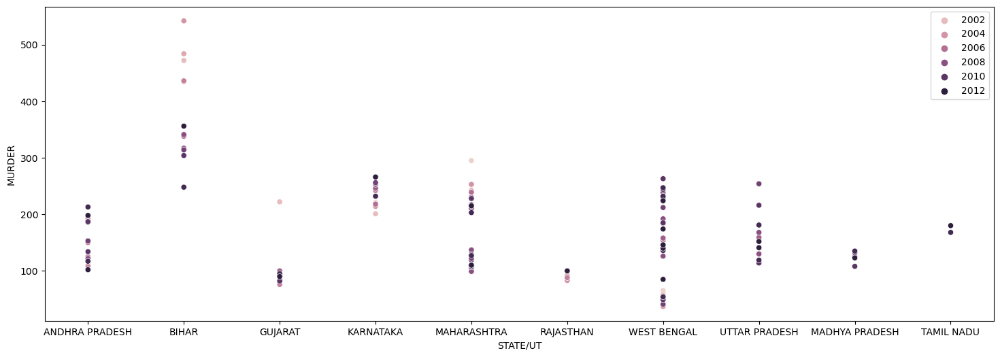

In [73]:
plt.figure(figsize=(18,6))
sns.scatterplot(x = "STATE/UT", y = "MURDER", data = sensitivearea,hue='YEAR')
plt.legend()
#plt.tight_layout()
plt.show()

In 2004, Bihar recorded the highest number of murder cases.

In [74]:
g = sns.pairplot(sensitivearea)
for ax in g.axes.flat:
    ax.tick_params("x", labelrotation=90)
plt.show()

Examining the trends for each sort of crime from 2001 to 2012.

Text(0, 0.5, 'Cases of INSULT TO MODESTY OF WOMEN in India')

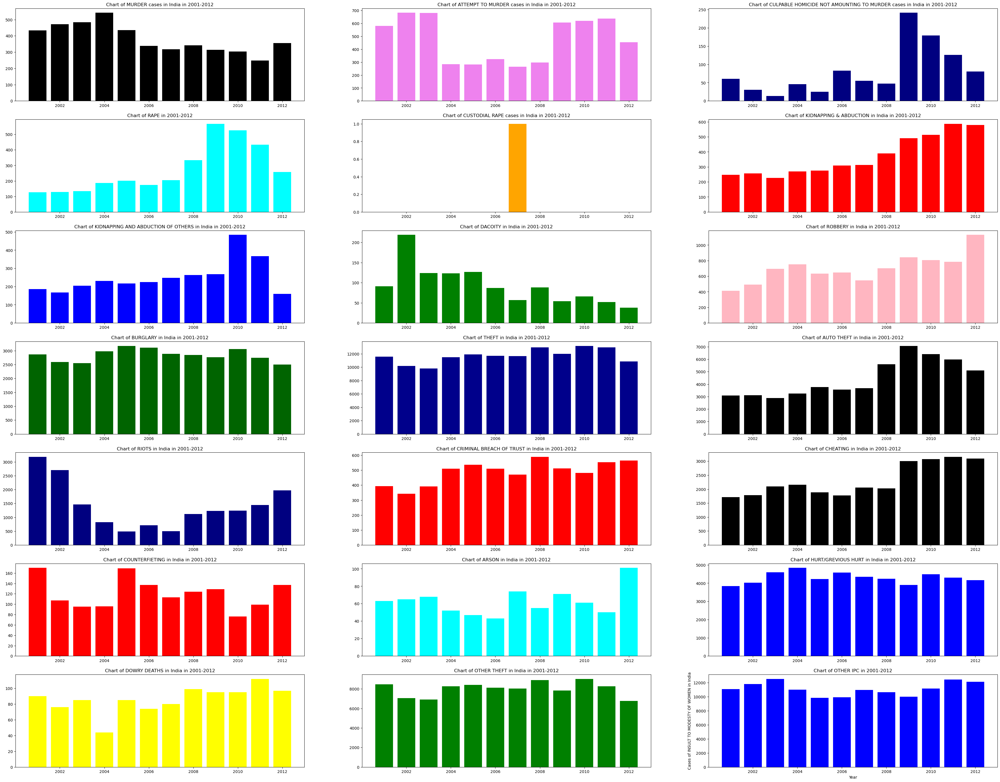

In [75]:
fig, axes = plt.subplots(7, 3, figsize=(45, 35))

axes[0,0].set_title("Chart of MURDER cases in India in 2001-2012")
axes[0,0].bar(sensitivearea['YEAR'], sensitivearea['MURDER'], color = 'black');
plt.xlabel('YEAR') #(X-axis)
plt.ylabel('Cases of MURDER in India') #(Y-axis)

axes[0,1].set_title("Chart of ATTEMPT TO MURDER cases in India in 2001-2012")
axes[0,1].bar(sensitivearea['YEAR'], sensitivearea['ATTEMPT TO MURDER'], color = 'violet');
plt.xlabel('Year') #(X-axis)
plt.ylabel('Cases of ATTEMPT TO MURDER in India') #(Y-axis)

axes[0,2].set_title("Chart of CULPABLE HOMICIDE NOT AMOUNTING TO MURDER cases in India in 2001-2012")
axes[0,2].bar(sensitivearea['YEAR'], sensitivearea['CULPABLE HOMICIDE NOT AMOUNTING TO MURDER'], color = 'navy');
plt.xlabel('Year') #(X-axis)
plt.ylabel('Cases of CULPABLE HOMICIDE NOT AMOUNTING TO MURDER in India') #(Y-axis)

axes[1,0].set_title("Chart of RAPE in 2001-2012")
axes[1,0].bar(sensitivearea['YEAR'], sensitivearea['RAPE'], color = 'cyan');
plt.xlabel('Year') #(X-axis)
plt.ylabel('Cases of RAPE in India') #(Y-axis)

axes[1,1].set_title("Chart of CUSTODIAL RAPE cases in India in 2001-2012")
axes[1,1].bar(sensitivearea['YEAR'], sensitivearea['CUSTODIAL RAPE'], color = 'orange');
plt.xlabel('YEAR') #(X-axis)
plt.ylabel('Cases of CUSTODIAL RAPE in India') #(Y-axis)

axes[1,2].set_title("Chart of KIDNAPPING & ABDUCTION in India in 2001-2012")
axes[1,2].bar(sensitivearea['YEAR'], sensitivearea['KIDNAPPING & ABDUCTION'], color = 'red');
plt.xlabel('Year') #(X-axis)
plt.ylabel('Cases of KIDNAPPING & ABDUCTION in India') #(Y-axis)

axes[2,0].set_title("Chart of KIDNAPPING AND ABDUCTION OF OTHERS in India in 2001-2012")
axes[2,0].bar(sensitivearea['YEAR'], sensitivearea['KIDNAPPING AND ABDUCTION OF OTHERS'], color = 'blue');
plt.xlabel('Year') #(X-axis)
plt.ylabel('Cases of KIDNAPPING AND ABDUCTION OF OTHERSin India') #(Y-axis)


axes[2,1].set_title("Chart of DACOITY in India in 2001-2012")
axes[2,1].bar(sensitivearea['YEAR'], sensitivearea['DACOITY'], color = 'green');
plt.xlabel('Year') #(X-axis)
plt.ylabel('Cases of DACOITY in India') #(Y-axis)

axes[2,2].set_title("Chart of ROBBERY in India in 2001-2012")
axes[2,2].bar(sensitivearea['YEAR'], sensitivearea['ROBBERY'], color = 'lightpink');
plt.xlabel('Year') #(X-axis)
plt.ylabel('Cases of ROBBERY in India') #(Y-axis)

axes[3,0].set_title("Chart of BURGLARY in India in 2001-2012")
axes[3,0].bar(sensitivearea['YEAR'], sensitivearea['BURGLARY'], color = 'darkgreen');
plt.xlabel('Year') #(X-axis)
plt.ylabel('Cases of BURGLARY in India') #(Y-axis)


axes[3,1].set_title("Chart of THEFT in India in 2001-2012")
axes[3,1].bar(sensitivearea['YEAR'], sensitivearea['THEFT'], color = 'darkblue');
plt.xlabel('Year') #(X-axis)
plt.ylabel('Cases of THEFT in India') #(Y-axis)


axes[3,2].set_title("Chart of AUTO THEFT in India in 2001-2012")
axes[3,2].bar(sensitivearea['YEAR'], sensitivearea['AUTO THEFT'], color = 'black');
plt.xlabel('Year') #(X-axis)
plt.ylabel('Cases of AUTO THEFT in India') #(Y-axis)


axes[4,0].set_title("Chart of RIOTS in India in 2001-2012")
axes[4,0].bar(sensitivearea['YEAR'], sensitivearea['RIOTS'], color = 'navy');
plt.xlabel('Year') #(X-axis)
plt.ylabel('Cases of RIOTS') #(Y-axis)

axes[4,1].set_title("Chart of CRIMINAL BREACH OF TRUST in India in 2001-2012")
axes[4,1].bar(sensitivearea['YEAR'], sensitivearea['CRIMINAL BREACH OF TRUST'], color = 'red');
plt.xlabel('Year') #(X-axis)
plt.ylabel('Cases of CRIMINAL BREACH OF TRUST in India') #(Y-axis)


axes[4,2].set_title("Chart of CHEATING in India in 2001-2012")
axes[4,2].bar(sensitivearea['YEAR'], sensitivearea['CHEATING'], color = 'black');
plt.xlabel('Year') #(X-axis)
plt.ylabel('Cases of CHEATING in India') #(Y-axis)

axes[5,0].set_title("Chart of COUNTERFIETING in India in 2001-2012")
axes[5,0].bar(sensitivearea['YEAR'], sensitivearea['COUNTERFIETING'], color = 'red');
plt.xlabel('Year') #(X-axis)
plt.ylabel('Cases of COUNTERFIETING in India') #(Y-axis)

axes[5,1].set_title("Chart of ARSON in India in 2001-2012")
axes[5,1].bar(sensitivearea['YEAR'], sensitivearea['ARSON'], color = 'cyan');
plt.xlabel('Year') #(X-axis)
plt.ylabel('Cases of ARSON in India') #(Y-axis)


axes[5,2].set_title("Chart of HURT/GREVIOUS HURT in India in 2001-2012")
axes[5,2].bar(sensitivearea['YEAR'], sensitivearea['HURT/GREVIOUS HURT'], color = 'blue');
plt.xlabel('Year') #(X-axis)
plt.ylabel('Cases of HURT/GREVIOUS HURT in India') #(Y-axis)

axes[6,0].set_title("Chart of DOWRY DEATHS in India in 2001-2012")
axes[6,0].bar(sensitivearea['YEAR'], sensitivearea['DOWRY DEATHS'], color = 'yellow');
plt.xlabel('Year') #(X-axis)
plt.ylabel('Cases of DOWRY DEATHS in India') #(Y-axis)

axes[6,1].set_title("Chart of OTHER THEFT in India in 2001-2012")
axes[6,1].bar(sensitivearea['YEAR'], sensitivearea['OTHER THEFT'], color = 'green');
plt.xlabel('Year') #(X-axis)
plt.ylabel('Cases of OTHER THEFT in India') #(Y-axis)

axes[6,2].set_title("Chart of OTHER IPC in 2001-2012")
axes[6,2].bar(sensitivearea['YEAR'], sensitivearea['OTHER IPC CRIMES'], color = 'blue');
plt.xlabel('Year') #(X-axis)
plt.ylabel('Cases of INSULT TO MODESTY OF WOMEN in India') #(Y-axis)

## Examining Correlation in Dataframe for Sensitive Areas

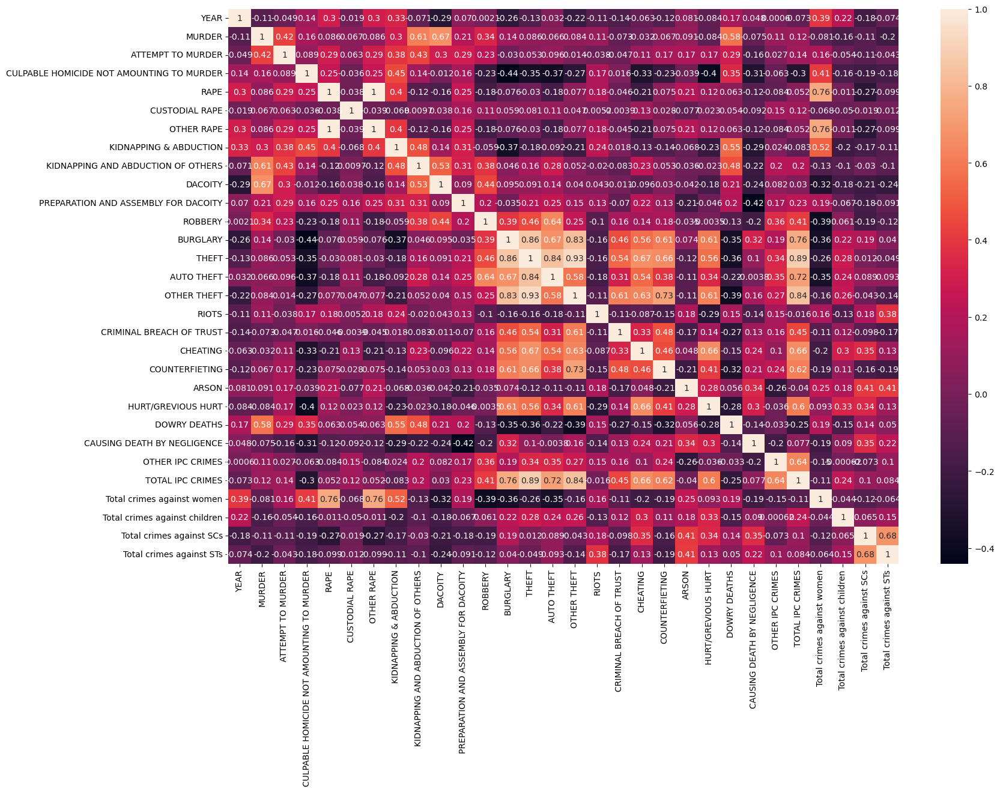

In [76]:
plt.figure(figsize=(18, 12))
numerical_columns = sensitivearea.select_dtypes(include=['float64', 'int64']).columns
sns.heatmap(sensitivearea[numerical_columns].corr(), annot=True)
plt.savefig('heatmap2.jpg')
plt.show()


Seaborn is used to construct the heatmap, which shows the correlation between the variables. The unique correlation between each feature and the other features in the dataset is displayed in the correlation matrix that was constructed.

When two variables have the following correlation:

0.0 to 0.3, their correlation is weak.

They have a moderate correlation (0.3–0.6).

0.6 to 0.9, indicating a strong correlation.

Ultimately, at >0.9, their correlation is extremely strong.

Positive and negative correlations show whether two variables are correlated directly or inversely; for example, a correlation of -0.7 between two variables means that, according to the preceding list, if one variable increases, the other one drops significantly.

It is evident from the heat map above that all crime categories, including murder, rape, and dowry deaths, have a positive correlation with the total number of IPC offenses.

Furthermore positively connected are kidnapping, abduction, and other rape/rape incidents.

There is a positive correlation between crime against SCs and crime against STs.

# Analysing the Moderate Region

In [77]:
pd.pivot_table(moderatearea, values =['MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS',  'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES',
       'Total crimes against women', 'Total crimes against children',
       'Total crimes against SCs', 'Total crimes against STs'], index =['STATE/UT','DISTRICT', 'YEAR'],
                          aggfunc = max)
#'Year' and 'State' features in a pivot table that illustrates a specific crime

ARSON  ATTEMPT TO MURDER  AUTO THEFT  \
STATE/UT       DISTRICT       YEAR                                           
ANDHRA PRADESH ADILABAD       2001.0   30.0               60.0        22.0   
                              2002.0   38.0               79.0        32.0   
                              2003.0   42.0               65.0        35.0   
                              2004.0   30.0               83.0        46.0   
                              2005.0   30.0               48.0        53.0   
...                                     ...                ...         ...   
WEST BENGAL    UTTAR DINAJPUR 2008.0   17.0               98.0        53.0   
                              2009.0   11.0               86.0        89.0   
                              2010.0   10.0              106.0       114.0   
                              2011.0   20.0              178.0       119.0   
                              2012.0   33.0              283.0       129.0   

                                      BURGLARY  CAUSING DEATH BY NEGLIGENCE  \
STATE/UT       DISTRICT       YEAR                                            
ANDHRA PRADESH ADILABAD       2001.0     198.0                        181.0   
                              2002.0     193.0                        225.0   
                              2003.0     207.0                        248.0   
                              2004.0     177.0                        271.0   
                              2005.0     191.0                        276.0   
...                                        ...                          ...   
WEST BENGAL    UTTAR DINAJPUR 2008.0      10.0                          5.0   
                              2009.0       8.0                          2.0   
                              2010.0       4.0                          2.0   
                              2011.0      10.0                          7.0   
                              2012.0       7.0                          3.0   

                                      CHEATING  COUNTERFIETING  \
STATE/UT       DISTRICT       YEAR                               
ANDHRA PRADESH ADILABAD       2001.0     104.0             1.0   
                              2002.0     135.0             0.0   
                              2003.0     146.0             1.0   
                              2004.0     152.0             5.0   
                              2005.0     173.0             4.0   
...                                        ...             ...   
WEST BENGAL    UTTAR DINAJPUR 2008.0      20.0            10.0   
                              2009.0      40.0             6.0   
                              2010.0      34.0             2.0   
                              2011.0      33.0             3.0   
                              2012.0      64.0             6.0   

                                      CRIMINAL BREACH OF TRUST  \
STATE/UT       DISTRICT       YEAR                               
ANDHRA PRADESH ADILABAD       2001.0                      16.0   
                              2002.0                      25.0   
                              2003.0                      19.0   
                              2004.0                      34.0   
                              2005.0                      13.0   
...                                                        ...   
WEST BENGAL    UTTAR DINAJPUR 2008.0                      14.0   
                              2009.0                       9.0   
                              2010.0                       9.0   
                              2011.0                      16.0   
                              2012.0                      18.0   

                                      CULPABLE HOMICIDE NOT AMOUNTING TO MURDER  \
STATE/UT       DISTRICT       YEAR                                                
ANDHRA PRADESH ADILABAD       2001.0                                       17.0   
                            

In [78]:
print("We have {} Rows and {} Columns in our dataframe Moderate Area ".format(moderatearea.shape[0], moderatearea.shape[1]))

We have 2295 Rows and 33 Columns in our dataframe Moderate Area 


In [79]:
moderatearea['STATE/UT'].value_counts()

STATE/UT
UTTAR PRADESH      297
MADHYA PRADESH     243
ANDHRA PRADESH     242
MAHARASHTRA        241
BIHAR              239
RAJASTHAN          193
TAMIL NADU         138
KERALA             132
WEST BENGAL        128
ASSAM               93
JHARKHAND           65
KARNATAKA           58
ODISHA              54
HARYANA             50
GUJARAT             44
CHHATTISGARH        43
PUNJAB              18
UTTARAKHAND          9
JAMMU & KASHMIR      4
TRIPURA              4
Name: count, dtype: int64

In [80]:
moderatearea['DISTRICT'].value_counts()

DISTRICT
ADILABAD        12
NAGPUR RURAL    12
JALGAON         12
BULDHANA        12
BEED            12
                ..
MEHSANA          1
BANKA            1
DAMOH            1
SULTANPUR        1
BKP CP           1
Name: count, Length: 326, dtype: int64

In [81]:
moderatearea.describe().T

,count,mean,std,min,25%,50%,75%,max
YEAR,2295.0,2006.967320,3.523402,2001.0,2004.0,2007.0,2010.0,2012.0
MURDER,2295.0,83.535512,43.249126,4.0,54.0,76.0,104.0,324.0
ATTEMPT TO MURDER,2295.0,77.450545,62.076886,0.0,38.0,62.0,98.0,741.0
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,2295.0,9.665359,13.493694,0.0,1.0,4.0,13.0,148.0
RAPE,2295.0,50.603050,33.561453,2.0,28.0,43.0,63.0,369.0
CUSTODIAL RAPE,2295.0,0.007407,0.139862,0.0,0.0,0.0,0.0,5.0
OTHER RAPE,2295.0,50.595643,33.552070,2.0,28.0,43.0,63.0,369.0
KIDNAPPING & ABDUCTION,2295.0,74.416993,55.537431,1.0,34.0,61.0,97.5,386.0
KIDNAPPING AND ABDUCTION OF OTHERS,2295.0,18.574728,20.186132,0.0,6.0,13.0,24.0,258.0
DACOITY,2295.0,12.595207,14.539921,0.0,3.0,8.0,16.0,112.0


**The minimum and maximum of each crime—murder, rape, IPC, TOTAL IPC CRIMES, total crime against women, and crime against STs and SCs are displayed. These are the data from 2001 to 2012. In this cluster, maximum value is less than the sensitive area cluster's maximum value.**

# State/UT versus all IPC offenses

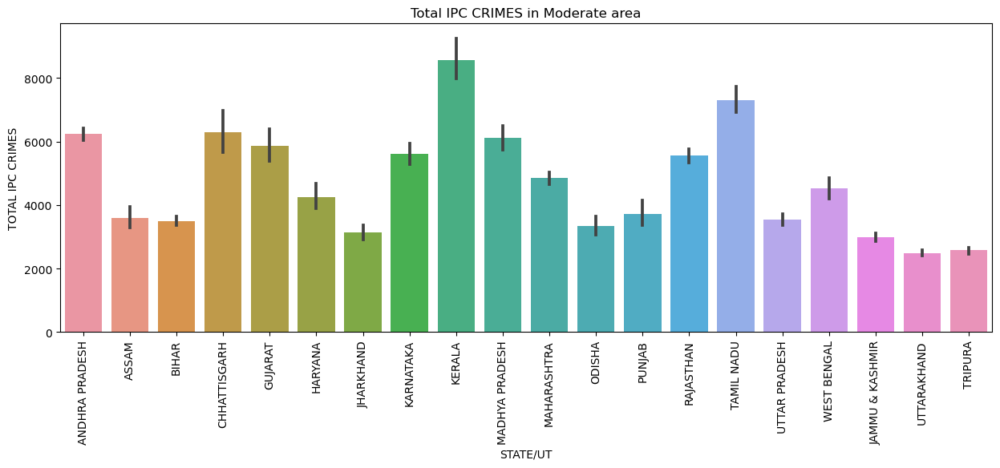

In [82]:
plt.figure(figsize=(15, 5))
sns.barplot(x='STATE/UT', y='TOTAL IPC CRIMES',data=moderatearea)
plt.xticks(rotation=90)
plt.title("Total IPC CRIMES in Moderate area")
plt.savefig('Total IPC CRIMES in Moderate area.jpg')
plt.show()

**Kerala is the state with the highest level of sensitivity to all IPC crimes.**

# Total Crimes Against Women versus State/UT

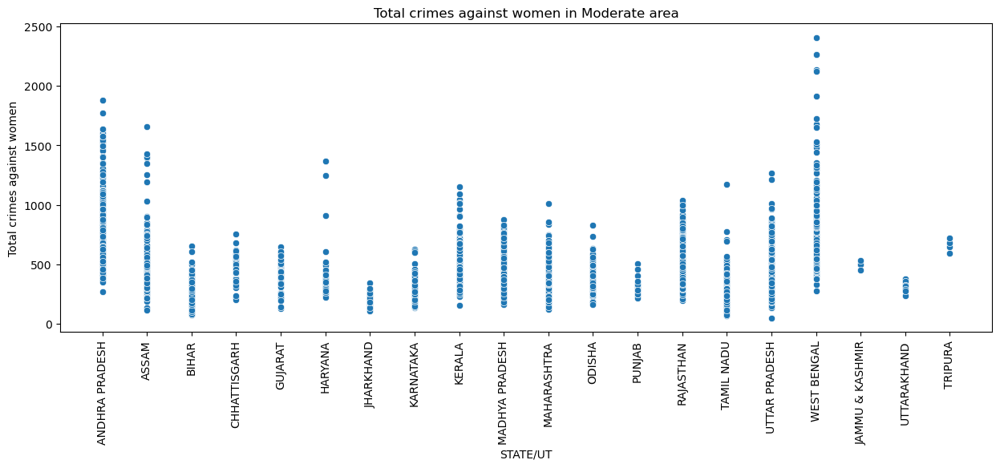

In [83]:
plt.figure(figsize=(15, 5))
sns.scatterplot(x='STATE/UT', y='Total crimes against women',data=moderatearea)
plt.xticks(rotation=90)
plt.title("Total crimes against women in Moderate area")
plt.savefig('Total crimes against women in Moderate area.jpg')
plt.show()

**The top three states in terms of crime against women are Uttar Pradesh, West Bengal, and Andhra Pradesh.**

# Total crimes against SCs vs. State/UT

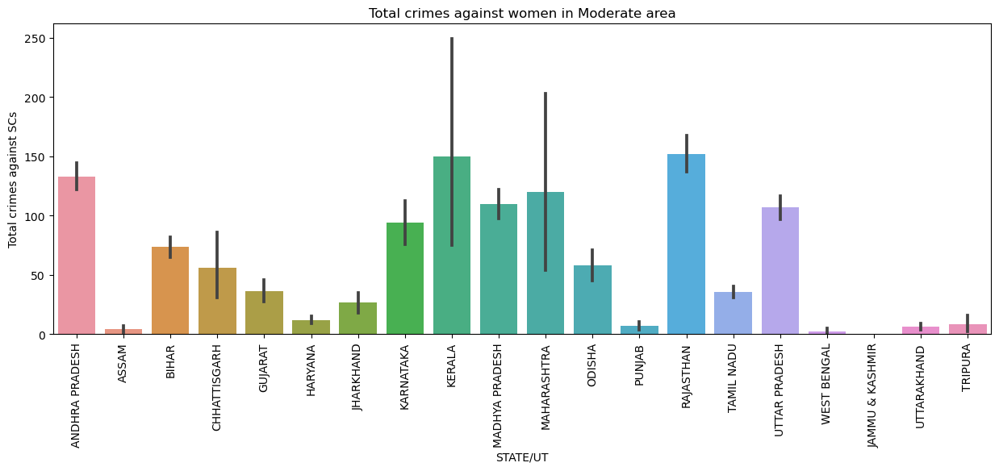

In [84]:
plt.figure(figsize=(15, 5))
sns.barplot(x='STATE/UT', y='Total crimes against SCs',data=moderatearea)
plt.xticks(rotation=90)
plt.title("Total crimes against women in Moderate area")
plt.savefig('Total crimes against women in Moderate area.jpg')
plt.show()

**Kerala, Rajasthan, and Andhra Pradesh have the most crimes against SCs.**

# Total offenses against STs vs. State/UT

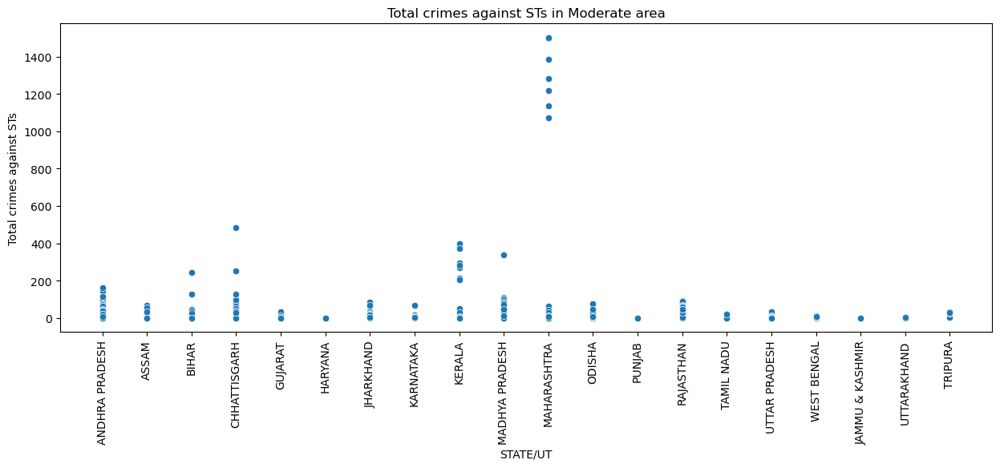

In [85]:
plt.figure(figsize=(15, 5))
sns.scatterplot(x='STATE/UT', y='Total crimes against STs',data=moderatearea)
plt.xticks(rotation=90)
plt.title("Total crimes against STs in Moderate area")
plt.savefig('Total crimes against STs in Moderate area.jpg')

plt.show()

All states, with the exception of Maharashtra, have lower crime rates against Scheduled Tribes (STs). This is because our region is moderate, meaning that districts fall into neither the peaceful nor the violent categories.

# Using a pie chart, checking the percentage of each crime in the dataset for moderate areas.

In [86]:
tot_murder= moderatearea['MURDER'].sum()
tot_rape= moderatearea['RAPE'].sum()
tot_dowrydeaths = moderatearea['DOWRY DEATHS'].sum()

tot_kidnap= moderatearea['KIDNAPPING & ABDUCTION'].sum()
tot_dacoity= moderatearea['DACOITY'].sum()
tot_robbery = moderatearea['ROBBERY'].sum()
tot_burglary= moderatearea['BURGLARY'].sum()
tot_theft= moderatearea['THEFT'].sum()
tot_crimes_against_women = moderatearea['Total crimes against women'].sum()
tot_crimes_against_STs = moderatearea['Total crimes against STs'].sum()
tot_crimes_against_SCs = moderatearea['Total crimes against SCs'].sum()
tot_crimes_against_children = moderatearea['Total crimes against children'].sum()


crime_group = ['TOTAL Murder','TOTAL rape','Total Dowry Deaths','Total Kidnapping','TOTAL Dacoity','Total Robbery','TOtal Burglary','Total Theft','Total Riots',
                'Total Crimes Against Women','Total Crimes Against SC','Total Crimes against STs','Total Crimes Against Children']
values = [tot_murder,tot_rape,tot_dowrydeaths,tot_kidnap,tot_dacoity,tot_robbery,tot_burglary,
          tot_theft,tot_riots,tot_crimes_against_women,tot_crimes_against_STs,tot_crimes_against_SCs,tot_crimes_against_children]

colors = ['crimson','gold','green','yellow','blue','black']

In [87]:
import plotly.graph_objects as go

fig = go.Figure(go.Pie(labels=crime_group, values=values, sort=False, marker=dict(colors=colors), textfont_size=12))
fig.update_layout(width=800, height=600)  # Adjust width and height as needed
fig.show()


Total theft accounts for the largest percentage of the data, 37.1%, while total dacoity accounts for the lowest percentage,0.63%.

In [88]:
moderatearea.groupby('DISTRICT').min()

,STATE/UT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF OTHERS,...,HURT/GREVIOUS HURT,DOWRY DEATHS,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,Total crimes against women,Total crimes against children,Total crimes against SCs,Total crimes against STs,cluster
DISTRICT,,,,,,,,,,,,,,,,,,,,,
24 PARGANAS NORTH,WEST BENGAL,2001.0,168.0,6.0,38.0,53.0,0.0,53.0,81.0,0.0,...,0.0,23.0,0.0,3036.0,6167.0,649.0,0.0,0,0,2
24 PARGANAS SOUTH,WEST BENGAL,2001.0,107.0,2.0,34.0,47.0,0.0,47.0,53.0,1.0,...,0.0,43.0,0.0,3211.0,5827.0,681.0,0.0,0,0,2
ADILABAD,ANDHRA PRADESH,2001.0,73.0,39.0,8.0,35.0,0.0,35.0,41.0,6.0,...,1044.0,5.0,181.0,881.0,4154.0,454.0,0.0,14,0,2
AGRA,UTTAR PRADESH,2001.0,109.0,116.0,18.0,26.0,0.0,26.0,99.0,26.0,...,360.0,38.0,40.0,896.0,3438.0,452.0,26.0,4,0,2
AHMEDNAGAR,MAHARASHTRA,2001.0,81.0,38.0,0.0,41.0,0.0,41.0,25.0,7.0,...,575.0,0.0,445.0,975.0,4251.0,404.0,12.0,13,4,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WARANGAL URBAN,ANDHRA PRADESH,2011.0,46.0,10.0,5.0,35.0,0.0,35.0,55.0,40.0,...,499.0,26.0,230.0,1730.0,3797.0,271.0,4426.0,96,57,2
WARDHA,MAHARASHTRA,2008.0,36.0,27.0,3.0,26.0,0.0,26.0,26.0,4.0,...,744.0,2.0,176.0,1197.0,3882.0,333.0,54.0,17,18,2
WEST,TRIPURA,2008.0,61.0,14.0,0.0,76.0,0.0,76.0,48.0,6.0,...,362.0,6.0,6.0,641.0,2420.0,591.0,154.0,2,3,2


**Investigating the region with the greatest total theft and rioting numbers.**

In [89]:
moderatearea.groupby('DISTRICT')['THEFT'].sum().sort_values()

DISTRICT
KANDHAMAL           45.0
BANKA              111.0
DAMOH              142.0
TIKAMGARH          172.0
BHIM NAGAR         196.0
                  ...   
GURGAON          22241.0
SURAT COMMR.     23340.0
CHENNAI          24344.0
BHOPAL           25093.0
NAGPUR COMMR.    27488.0
Name: THEFT, Length: 326, dtype: float64

In [90]:
moderatearea.loc[moderatearea['DISTRICT'] == 'SOUTH'].max()

STATE/UT                                     NaN
DISTRICT                                     NaN
YEAR                                         NaN
MURDER                                       NaN
ATTEMPT TO MURDER                            NaN
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER    NaN
RAPE                                         NaN
CUSTODIAL RAPE                               NaN
OTHER RAPE                                   NaN
KIDNAPPING & ABDUCTION                       NaN
KIDNAPPING AND ABDUCTION OF OTHERS           NaN
DACOITY                                      NaN
PREPARATION AND ASSEMBLY FOR DACOITY         NaN
ROBBERY                                      NaN
BURGLARY                                     NaN
THEFT                                        NaN
AUTO THEFT                                   NaN
OTHER THEFT                                  NaN
RIOTS                                        NaN
CRIMINAL BREACH OF TRUST                     NaN
CHEATING            

**The district of Kandhamal in Odisha has the fewest total theft incidents—35—while the district of South Delhi has the most—counting 4104 total theft crimes in 2012.**

In [91]:
moderatearea.groupby('DISTRICT')['RIOTS'].sum().sort_values()

DISTRICT
KANYAKUMARI       0.0
CP LUDHIANA       0.0
PATIALA           0.0
LUDHIANA          0.0
BIKANER           1.0
                ...  
PALAKKAD       6123.0
KOLLAM         6415.0
THRISSUR       6521.0
MALAPPURAM     7386.0
KANNUR         8216.0
Name: RIOTS, Length: 326, dtype: float64

In [92]:
moderatearea.loc[moderatearea['DISTRICT'] == 'KANNUR'].max()

STATE/UT                                     KERALA
DISTRICT                                     KANNUR
YEAR                                         2012.0
MURDER                                         32.0
ATTEMPT TO MURDER                              58.0
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER      10.0
RAPE                                           66.0
CUSTODIAL RAPE                                  0.0
OTHER RAPE                                     66.0
KIDNAPPING & ABDUCTION                         23.0
KIDNAPPING AND ABDUCTION OF OTHERS              8.0
DACOITY                                        14.0
PREPARATION AND ASSEMBLY FOR DACOITY            5.0
ROBBERY                                        99.0
BURGLARY                                      277.0
THEFT                                         257.0
AUTO THEFT                                    103.0
OTHER THEFT                                   159.0
RIOTS                                        1277.0
CRIMINAL BRE

**Kerala's Kannur District had the most number of riots in 2012—1277 in numbers.**

In [93]:
moderatearea['STATE/UT'].value_counts()

STATE/UT
UTTAR PRADESH      297
MADHYA PRADESH     243
ANDHRA PRADESH     242
MAHARASHTRA        241
BIHAR              239
RAJASTHAN          193
TAMIL NADU         138
KERALA             132
WEST BENGAL        128
ASSAM               93
JHARKHAND           65
KARNATAKA           58
ODISHA              54
HARYANA             50
GUJARAT             44
CHHATTISGARH        43
PUNJAB              18
UTTARAKHAND          9
JAMMU & KASHMIR      4
TRIPURA              4
Name: count, dtype: int64

The biggest number of districts are found in the moderate areas of Uttar Pradesh, Maharashtra, Andhra Pradesh, and Bihar; Tripura, Jammu & Kashmir, on the other hand, have only appeared three or four times. States like Tripura and Jammu & Kashmir are like tranquil states, but states like Uttar Pradesh, Maharashtra, Andhra Pradesh, and Bihar are extremely prone to crimes in a moderate area.

# Peaceful Area Cluster Analysis

In [94]:
pd.pivot_table(sensitivearea, values =['MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS',  'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES',
       'Total crimes against women', 'Total crimes against children',
       'Total crimes against SCs', 'Total crimes against STs'], index =['STATE/UT','DISTRICT', 'YEAR'],
                          aggfunc = max)
#'Year' and 'State' features in a pivot table that illustrates a specific crime

ARSON  ATTEMPT TO MURDER  AUTO THEFT  \
STATE/UT       DISTRICT    YEAR                                           
ANDHRA PRADESH CYBERABAD   2005.0   37.0               88.0       563.0   
                           2006.0   43.0               92.0       642.0   
                           2007.0   74.0               84.0      1124.0   
                           2008.0   42.0               66.0      1202.0   
                           2009.0   71.0               84.0      1365.0   
...                                  ...                ...         ...   
WEST BENGAL    MURSHIDABAD 2010.0   54.0              620.0       204.0   
                           2011.0   45.0              637.0       186.0   
                           2012.0   50.0              395.0       309.0   
               NADIA       2011.0   13.0              375.0       243.0   
                           2012.0   22.0              357.0       244.0   

                                   BURGLARY  CAUSING DEATH BY NEGLIGENCE  \
STATE/UT       DISTRICT    YEAR                                            
ANDHRA PRADESH CYBERABAD   2005.0    1139.0                        898.0   
                           2006.0    1321.0                       1064.0   
                           2007.0    1165.0                       1188.0   
                           2008.0    1319.0                       1166.0   
                           2009.0    1348.0                       1063.0   
...                                     ...                          ...   
WEST BENGAL    MURSHIDABAD 2010.0       7.0                        311.0   
                           2011.0      13.0                        290.0   
                           2012.0       4.0                        347.0   
               NADIA       2011.0      20.0                        156.0   
                           2012.0      21.0                        285.0   

                                   CHEATING  COUNTERFIETING  \
STATE/UT       DISTRICT    YEAR                               
ANDHRA PRADESH CYBERABAD   2005.0     950.0             5.0   
                           2006.0    1275.0             6.0   
                           2007.0    1192.0             5.0   
                           2008.0    1183.0             6.0   
                           2009.0    1174.0            13.0   
...                                     ...             ...   
WEST BENGAL    MURSHIDABAD 2010.0     170.0            30.0   
                           2011.0     189.0            27.0   
                           2012.0     157.0           110.0   
               NADIA       2011.0     291.0            11.0   
                           2012.0     338.0            21.0   

                                   CRIMINAL BREACH OF TRUST  \
STATE/UT       DISTRICT    YEAR                               
ANDHRA PRADESH CYBERABAD   2005.0                      83.0   
                           2006.0                     156.0   
                           2007.0                     103.0   
                           2008.0                     103.0   
                           2009.0                     124.0   
...                                                     ...   
WEST BENGAL    MURSHIDABAD 2010.0                      54.0   
                           2011.0                      96.0   
                           2012.0                      92.0   
               NADIA       2011.0                      99.0   
                           2012.0                     132.0   

                                   CULPABLE HOMICIDE NOT AMOUNTING TO MURDER  \
STATE/UT       DISTRICT    YEAR                                                
ANDHRA PRADESH CYBERABAD   2005.0                                       10.0   
                           2006.0                                       11.0   
                           2007.0                                        8.0   
                           200

In [95]:
print("We have {} Rows and {} Columns in our dataframe Peaceful Area ".format(peacefularea.shape[0], peacefularea.shape[1]))

We have 2295 Rows and 33 Columns in our dataframe Peaceful Area 


In [96]:
peacefularea['STATE/UT'].value_counts()

STATE/UT
UTTAR PRADESH      297
MADHYA PRADESH     243
ANDHRA PRADESH     242
MAHARASHTRA        241
BIHAR              239
RAJASTHAN          193
TAMIL NADU         138
KERALA             132
WEST BENGAL        128
ASSAM               93
JHARKHAND           65
KARNATAKA           58
ODISHA              54
HARYANA             50
GUJARAT             44
CHHATTISGARH        43
PUNJAB              18
UTTARAKHAND          9
JAMMU & KASHMIR      4
TRIPURA              4
Name: count, dtype: int64

In [97]:
peacefularea['DISTRICT'].value_counts()

DISTRICT
ADILABAD        12
NAGPUR RURAL    12
JALGAON         12
BULDHANA        12
BEED            12
                ..
MEHSANA          1
BANKA            1
DAMOH            1
SULTANPUR        1
BKP CP           1
Name: count, Length: 326, dtype: int64

In [98]:
peacefularea.describe().T

,count,mean,std,min,25%,50%,75%,max
YEAR,2295.0,2006.967320,3.523402,2001.0,2004.0,2007.0,2010.0,2012.0
MURDER,2295.0,83.535512,43.249126,4.0,54.0,76.0,104.0,324.0
ATTEMPT TO MURDER,2295.0,77.450545,62.076886,0.0,38.0,62.0,98.0,741.0
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,2295.0,9.665359,13.493694,0.0,1.0,4.0,13.0,148.0
RAPE,2295.0,50.603050,33.561453,2.0,28.0,43.0,63.0,369.0
CUSTODIAL RAPE,2295.0,0.007407,0.139862,0.0,0.0,0.0,0.0,5.0
OTHER RAPE,2295.0,50.595643,33.552070,2.0,28.0,43.0,63.0,369.0
KIDNAPPING & ABDUCTION,2295.0,74.416993,55.537431,1.0,34.0,61.0,97.5,386.0
KIDNAPPING AND ABDUCTION OF OTHERS,2295.0,18.574728,20.186132,0.0,6.0,13.0,24.0,258.0
DACOITY,2295.0,12.595207,14.539921,0.0,3.0,8.0,16.0,112.0


**We have the lowest values for each state's peaceful area, which indicates that the dataset's crime rate is the lowest, as shown by the describe method.**

# State/UT versus all IPC offenses

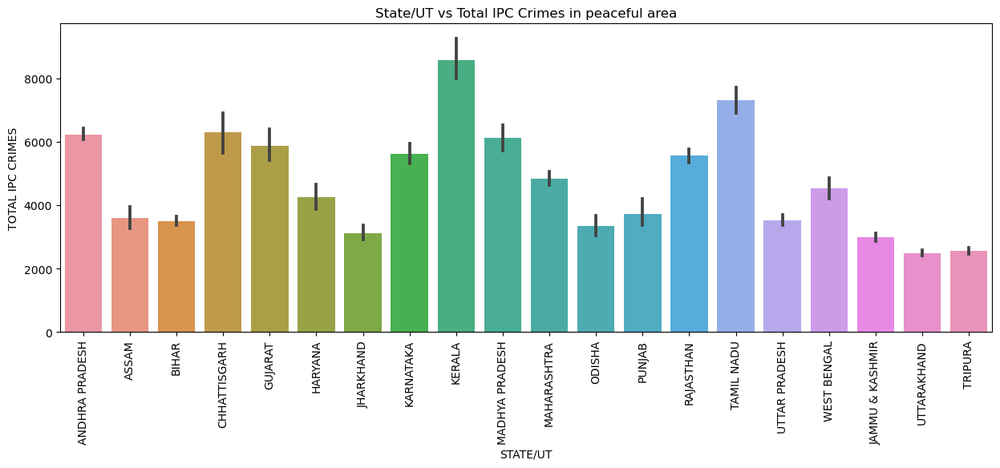

In [99]:
plt.figure(figsize=(15, 5))
sns.barplot(x='STATE/UT', y='TOTAL IPC CRIMES',data=peacefularea)
plt.xticks(rotation=90)
plt.title('State/UT vs Total IPC Crimes in peaceful area')
plt.savefig('Total IPC Crimes in peaceful area.jpg')
plt.show()

**Kerala, Tamil Nadu, Chandigarh, Karnataka, Gujarat, and Andhra Pradesh are the states with the highest numbers of Total IPC offenses in Peaceful Area.**

**The states with the lowest number of total IPC crimes are Arunachal Pradesh, Manipur, Meghalaya, Mizoram, Nagaland, and Sikkim.**

# Total Crimes against Women vs State/UT

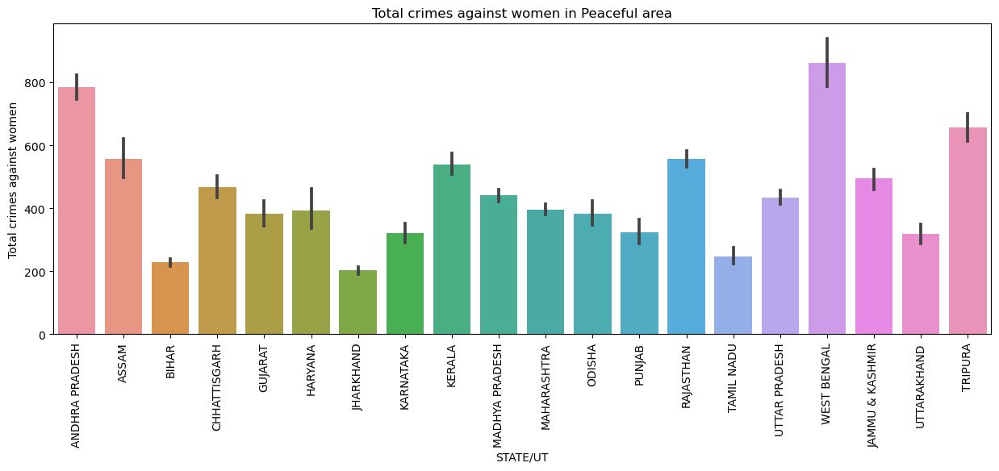

In [102]:
plt.figure(figsize=(15, 5))
sns.barplot(x='STATE/UT', y='Total crimes against women',data=peacefularea)
plt.xticks(rotation= 'vertical')
plt.title("Total crimes against women in Peaceful area")
plt.savefig('crime agains women inoeacefula area')
plt.show()

**Sikkim and Uttarakhand have the highest total crime rates against SCs, while other states have relatively low total crime rates against SCs.**

# Total offenses against STs vs. State/UT

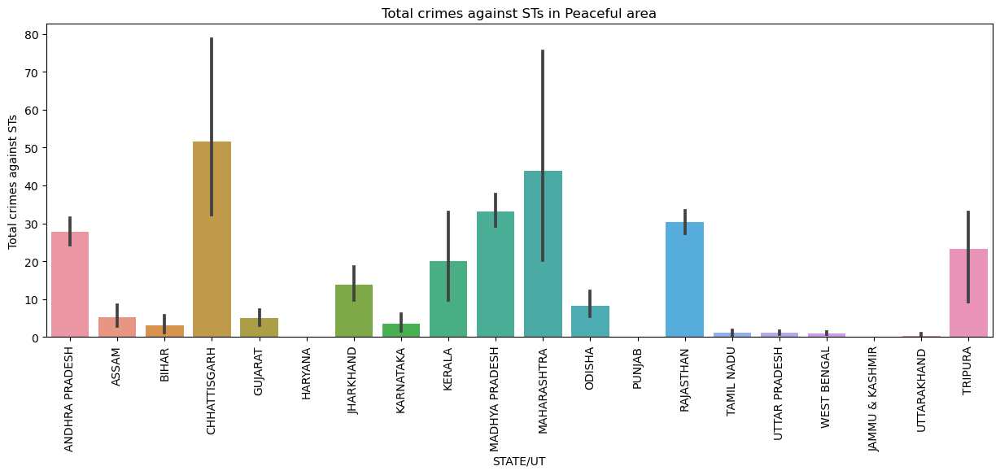

In [104]:
plt.figure(figsize=(15, 5))
sns.barplot(x='STATE/UT', y='Total crimes against STs',data=peacefularea)
plt.xticks(rotation=90)
plt.title("Total crimes against STs in Peaceful area")
plt.savefig('crimes against STs in Peaceful area')
plt.show()

# State/UT versus all offenses committed against Children

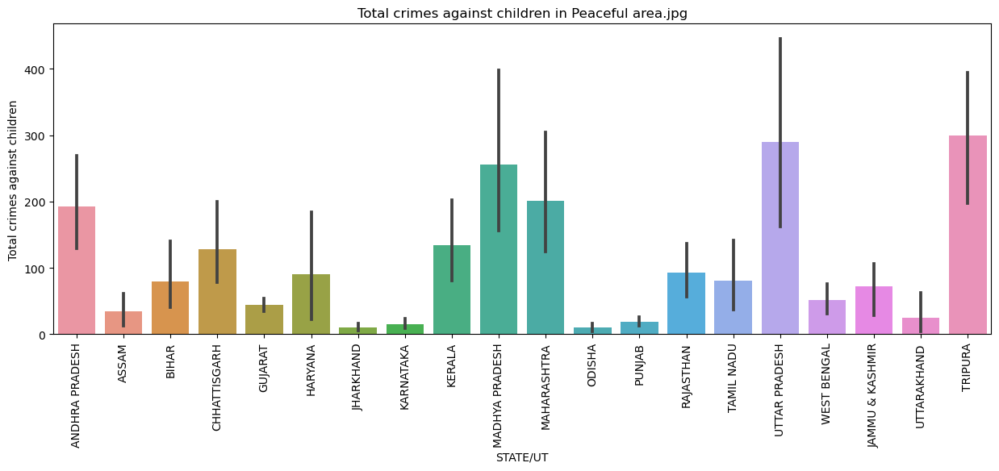

In [105]:
plt.figure(figsize=(15, 5))
sns.barplot(x='STATE/UT', y='Total crimes against children',data=peacefularea)
plt.xticks(rotation=90)
plt.title("Total crimes against children in Peaceful area.jpg")
plt.show()

In a 12-year period (2001–2012), the states with data that are below 300 include Delhi UT, Madhya Pradesh, and Maharashtra.

Mizoram, Manipur, Meghalaya, and Arunchal Pradesh have the lowest total numbers of crimes against Chinese children.

In [106]:
tot_murder= peacefularea['MURDER'].sum()
tot_rape= peacefularea['RAPE'].sum()
tot_dowrydeaths = peacefularea['DOWRY DEATHS'].sum()

tot_kidnap= peacefularea['KIDNAPPING & ABDUCTION'].sum()
tot_dacoity= peacefularea['DACOITY'].sum()
tot_robbery = peacefularea['ROBBERY'].sum()
tot_burglary= peacefularea['BURGLARY'].sum()
tot_theft= peacefularea['THEFT'].sum()
tot_crimes_against_women = peacefularea['Total crimes against women'].sum()
tot_crimes_against_STs = peacefularea['Total crimes against STs'].sum()
tot_crimes_against_SCs = peacefularea['Total crimes against SCs'].sum()
tot_crimes_against_children = peacefularea['Total crimes against children'].sum()


crime_group = ['TOTAL Murder','TOTAL rape','Total Dowry Deaths','Total Kidnapping','TOTAL Dacoity','Total Robbery','TOtal Burglary','Total Theft','Total Riots',
                'Total Crimes Against Women','Total Crimes Against SC','Total Crimes against STs','Total Crimes Against Children']
values = [tot_murder,tot_rape,tot_dowrydeaths,tot_kidnap,tot_dacoity,tot_robbery,tot_burglary,
          tot_theft,tot_riots,tot_crimes_against_women,tot_crimes_against_STs,tot_crimes_against_SCs,tot_crimes_against_children]

colors = ['crimson','gold','green','yellow','blue','black']

In [107]:
import plotly.graph_objects as go

fig = go.Figure(go.Pie(labels=crime_group, values=values, sort=False, marker=dict(colors=colors), textfont_size=12))
fig.update_layout(width=800, height=600)  # Adjust width and height as needed
fig.show()

**Total Theft, with 31.9%, has the largest percentage of crime, while Total Dacoity has the lowest percentage.**

In [108]:
peacefularea.groupby('DISTRICT').min()

,STATE/UT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF OTHERS,...,HURT/GREVIOUS HURT,DOWRY DEATHS,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,Total crimes against women,Total crimes against children,Total crimes against SCs,Total crimes against STs,cluster
DISTRICT,,,,,,,,,,,,,,,,,,,,,
24 PARGANAS NORTH,WEST BENGAL,2001.0,168.0,6.0,38.0,53.0,0.0,53.0,81.0,0.0,...,0.0,23.0,0.0,3036.0,6167.0,649.0,0.0,0,0,2
24 PARGANAS SOUTH,WEST BENGAL,2001.0,107.0,2.0,34.0,47.0,0.0,47.0,53.0,1.0,...,0.0,43.0,0.0,3211.0,5827.0,681.0,0.0,0,0,2
ADILABAD,ANDHRA PRADESH,2001.0,73.0,39.0,8.0,35.0,0.0,35.0,41.0,6.0,...,1044.0,5.0,181.0,881.0,4154.0,454.0,0.0,14,0,2
AGRA,UTTAR PRADESH,2001.0,109.0,116.0,18.0,26.0,0.0,26.0,99.0,26.0,...,360.0,38.0,40.0,896.0,3438.0,452.0,26.0,4,0,2
AHMEDNAGAR,MAHARASHTRA,2001.0,81.0,38.0,0.0,41.0,0.0,41.0,25.0,7.0,...,575.0,0.0,445.0,975.0,4251.0,404.0,12.0,13,4,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WARANGAL URBAN,ANDHRA PRADESH,2011.0,46.0,10.0,5.0,35.0,0.0,35.0,55.0,40.0,...,499.0,26.0,230.0,1730.0,3797.0,271.0,4426.0,96,57,2
WARDHA,MAHARASHTRA,2008.0,36.0,27.0,3.0,26.0,0.0,26.0,26.0,4.0,...,744.0,2.0,176.0,1197.0,3882.0,333.0,54.0,17,18,2
WEST,TRIPURA,2008.0,61.0,14.0,0.0,76.0,0.0,76.0,48.0,6.0,...,362.0,6.0,6.0,641.0,2420.0,591.0,154.0,2,3,2


In [109]:
peacefularea.groupby('DISTRICT')['THEFT'].sum().sort_values()

DISTRICT
KANDHAMAL           45.0
BANKA              111.0
DAMOH              142.0
TIKAMGARH          172.0
BHIM NAGAR         196.0
                  ...   
GURGAON          22241.0
SURAT COMMR.     23340.0
CHENNAI          24344.0
BHOPAL           25093.0
NAGPUR COMMR.    27488.0
Name: THEFT, Length: 326, dtype: float64

In [110]:
peacefularea[peacefularea['DISTRICT']=='G.R.P.'].max()

STATE/UT                                     UTTAR PRADESH
DISTRICT                                            G.R.P.
YEAR                                                2011.0
MURDER                                                30.0
ATTEMPT TO MURDER                                     14.0
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER              9.0
RAPE                                                   2.0
CUSTODIAL RAPE                                         0.0
OTHER RAPE                                             2.0
KIDNAPPING & ABDUCTION                                13.0
KIDNAPPING AND ABDUCTION OF OTHERS                     7.0
DACOITY                                               30.0
PREPARATION AND ASSEMBLY FOR DACOITY                   4.0
ROBBERY                                              216.0
BURGLARY                                               1.0
THEFT                                               3043.0
AUTO THEFT                                            90

**In 2012, the G.R.P. district in Uttar Pradesh had the highest number of thefts.**

In [111]:
peacefularea['DISTRICT'].max()

'YAVATMAL'

After determining the maximum values for each offense in the dataframe, which are displayed below, YAVATMAL is the Maharashtra  DISTRICT that appeared the most in the dataframe.

In [113]:
peacefularea[peacefularea['DISTRICT']=='YAVATMAL'].max()

STATE/UT                                     MAHARASHTRA
DISTRICT                                        YAVATMAL
YEAR                                              2012.0
MURDER                                              84.0
ATTEMPT TO MURDER                                   87.0
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER           13.0
RAPE                                                66.0
CUSTODIAL RAPE                                       0.0
OTHER RAPE                                          66.0
KIDNAPPING & ABDUCTION                              65.0
KIDNAPPING AND ABDUCTION OF OTHERS                   8.0
DACOITY                                             10.0
PREPARATION AND ASSEMBLY FOR DACOITY                 7.0
ROBBERY                                             94.0
BURGLARY                                           342.0
THEFT                                             1253.0
AUTO THEFT                                         205.0
OTHER THEFT                    

In [114]:
peacefularea['DISTRICT'].min()

'24 PARGANAS NORTH'

In [116]:
peacefularea[peacefularea['DISTRICT']=='24 PARGANAS NORTH'].max()

STATE/UT                                           WEST BENGAL
DISTRICT                                     24 PARGANAS NORTH
YEAR                                                    2007.0
MURDER                                                   204.0
ATTEMPT TO MURDER                                         70.0
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER                 61.0
RAPE                                                     231.0
CUSTODIAL RAPE                                             0.0
OTHER RAPE                                               231.0
KIDNAPPING & ABDUCTION                                   236.0
KIDNAPPING AND ABDUCTION OF OTHERS                        58.0
DACOITY                                                   32.0
PREPARATION AND ASSEMBLY FOR DACOITY                     238.0
ROBBERY                                                   73.0
BURGLARY                                                  78.0
THEFT                                                  

The dataset's minimum entries for Andaman & Nicobar Islands Union Territory is displayed here, and the district's maximum value for each crime category in 2007 is displayed.

# Silhouette score

In [117]:
silhouette_score(X,y_kmeans)#cluster and information

0.42092307718309685

# 4.3 Analyzing our clusters and writing a report outlining all of our observations.

# **States in the sensitive area: 32 columns total and 140 rows overall.**

**Analysis of Crime Trends**

**Statewide Trends:**

Several states exhibit the highest crime rates across various categories.
Notably, West Bengal, Maharashtra, Andhra Pradesh, Bihar, Gujarat, Uttar Pradesh, Karnataka, Madhya Pradesh, Delhi, Uttar Pradesh (again), and Tamil Nadu have experienced an increase in crime.
These states raise significant safety concerns due to their elevated crime rates.

**District-Level Concerns:**

Specific districts within these states demonstrate alarming crime levels.
Districts such as Hyderabad City, Ahmedabad Commissionerate, Bangalore Commissionerate, Patna, Kolkata, Cyberabad, Lucknow, Pune Commissionerate, Mumbai Commissionerate, 24 Parganas North, Indore, 24 Parganas South, Thane Commissionerate, Jaipur, Mumbai, Murshidabad, North-West, Nada, Agra, Chennai, Ghaziabad, South, Jalpaiguri, Kanpur Nagar, North West, and Alwar are notable examples.

**State Characteristics:**

The aforementioned states, including West Bengal, Maharashtra, Andhra Pradesh, Uttar Pradesh, Bihar, Gujarat, Karnataka, Madhya Pradesh, Delhi, Uttar Pradesh (once more), and Tamil Nadu, are among the largest in terms of both population and area.
Population Dynamics:

Population size is a significant variable influencing crime frequency.
While population is a key factor, other socioeconomic indicators may also impact crime rates, although this analysis primarily focuses on population as the primary determining factor.

States such as West Bengal, Maharashtra, Andhra Pradesh, Uttar Pradesh, Bihar, Gujarat, Karnataka, Madhya Pradesh, Delhi, Uttar Pradesh, and Tamil Nadu are visible.These are largest states in terms of both population and area . One of the key variables determining the frequency of crime is population. The population is not the only socioeconomic aspect that might affect a location's crime rate. The influence of population is the sole factor considered in the current analysis of crime rate.

# States in a Moderate Area: A total of 33 columns and 2350 rows

**Analysis of Crime Clusters**

- **Moderate Crime Regions:**
  - Defined as areas with crime rates higher than peaceful regions but lower than sensitive areas.
  - States such as Bihar, Gujarat, Uttar Pradesh, West Bengal, Maharashtra, Andhra Pradesh, Karnataka, Rajasthan, Madhya Pradesh, Delhi, Uttar Pradesh (again), and Tamil Nadu consistently display elevated crime rates across various categories.

- **Other States with Moderate Crime Rates:**
  - In addition to the aforementioned states, other regions within the dataset, including Tripura, Punjab, Jharkhand, Odisha, Haryana, and Jammu & Kashmir, also demonstrate moderate levels of crime across different categories.

# States in a peaceful region: 6106 rows total, 33 columns total

 **Analysis of Crime Clusters**

- **Peaceful Areas Definition:**
  - Regions with lower crime rates compared to both sensitive and moderate areas.

- **High Crime Value States:**
  - States like West Bengal, Maharashtra, Andhra Pradesh, Uttar Pradesh, Bihar, Gujarat, Karnataka, and Rajasthan consistently exhibit higher crime values across all categories.

- **Smaller Crime States/Union Territories:**
  - Territories with lower crime rates include Puducherry, Chandigarh, Mizoram, Tripura, Manipur, Goa, Assam, Arunachal Pradesh, Sikkim, Nagaland, Uttarakhand, Daman & Diu, Dadar and Nagar Haveli, A & N Islands, and Lakshadweep.

- **Lowest Crime Count States:**
  - Peacefularea dataframe contains states with the lowest crime counts in each category.

- **Cluster Analysis:**
  - **Sensitive States:** Maharashtra, Rajasthan, Uttar Pradesh, Delhi, West Bengal, Tamil Nadu, Andhra Pradesh, Madhya Pradesh, Bihar.
  - **States in the Middle:** Himachal Pradesh, Uttarakhand, Kerala, Goa, Jharkhand, Karnataka, Chhattisgarh, Haryana.
  - **Peaceful States:** Sikkim, Mizoram, Tripura, Manipur, Assam, Nagaland, A & N Islands, Lakshadweep, Meghalaya, Arunachal Pradesh.

**Community Education and Crime Reduction:**
- Enhancing literacy rates within communities can lead to gradual reductions in crime rates and an overall improvement in quality of life.

**Government Welfare Programs:**
- Various welfare schemes are periodically released by the Indian government at all levels, targeting different segments of the population.
- Encouraging participation in these programs can contribute to personal development and societal improvement.
  
**Programs for Women and Children Development:**
- Programs such as Gender Equity and Women's Empowerment, POSHAN Abhiyaan, Anganwadi Services, Pradhan Mantri Matru Vandana Yojana (PMMVY), Beti Bachao Beti Padhao (BBBP), One Stop Center (OSC), Universalization of Women Helplines (WHL), Child Protection Services (CPS), and Scheme for Adolescent Girls (SAG) aim to uplift women and children, particularly in rural areas.

# 4.4 Telling the tale of the capstone project in our own words.

**Project Overview: Crimes in India**

- **Project Duration:** Four weeks
- **Objective:** To analyze crime data across India and understand patterns and trends.

**Data Collection and Assumptions:**
- Ten CSV files provided with information on States/UT, districts, years (2001–2012), and different crime heads.
- Assumptions made regarding missing data and calculations for annual population and literacy rates.

**Data Preprocessing:**
- Addition of necessary columns such as Population in Rural/Urban Area, Total Male, Total Female, Population Literacy, Male Literacy, Female Literacy, Area of Each State, and Different Crimes.
- Phase 2 involved analyzing state-by-state data for various crimes and identifying patterns.

**Exploratory Data Analysis (EDA):**
- Utilization of Python's Plotly module for interactive graph creation.
- Various types of charts utilized including line, scatter, bar, and scatterplots.

**Crime Rate Calculation:**
- Calculation of the crime rate in each state between 2001 and 2012.

**SQL Operations:**
- Phase 3 focused on data extraction and table insertion using SQL queries.
- Stored information in a dataframe for further analysis.

**Clustering Analysis:**
- Phase 4 implemented clustering by joining provided files to create a new dataset.
- Utilized the KMEANS algorithm for clustering into three categories: sensitive, moderate, and peaceful.
- Exploration of reasons behind crimes in sensitive states and proposed preventive measures.